# Concrete Compressive Strength Prediction

#### Problem Statement:
The quality of concrete is determined by its compressive strength, which is measured using a conventional crushing test on a concrete cylinder. The strength of the concrete is also a vital aspect in achieving the requisite longevity. It will take 28 days to test strength, which is a long period. So, what will we do now? We can save a lot of time and effort by using Data Science to estimate how much quantity of which raw material we need for acceptable 
compressive strength.

#### Approach
The classical machine learning tasks like Data Exploration, Data Cleaning, Feature Engineering, Model Building and Model Testing. Try out different machine learning algorithms that’s best fit for the above case.


#### Results
You have to build a solution that should able to predict the compressive strength of the concrete.


Dataset source : https://archive.ics.uci.edu/ml/datasets/Concrete+Compressive+Strength

Kaggale link : https://www.kaggle.com/datasets/elikplim/concrete-compressive-strength-data-set?datasetId=2330

In [34]:
# Import necessary modules

import numpy as np
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.preprocessing import PolynomialFeatures
import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')

In [6]:
# Load the data

df = pd.read_csv(r"D:\INeuron_Projects\Concrete_Com Test Pred\concrete_data.csv")
df.head()

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_aggregate,fine_aggregate,age,concrete_compressive_strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


#### Variable Information:

Given is the variable name, variable type, the measurement unit and a brief description. 
The concrete compressive strength is the regression problem. The order of this listing 
corresponds to the order of numerals along the rows of the database. 

Name -- Data Type -- Measurement -- Description

Cement (component 1) -- quantitative -- kg in a m3 mixture -- Input Variable

Blast Furnace Slag (component 2) -- quantitative -- kg in a m3 mixture -- Input Variable

Fly Ash (component 3) -- quantitative -- kg in a m3 mixture -- Input Variable

Water (component 4) -- quantitative -- kg in a m3 mixture -- Input Variable

Superplasticizer (component 5) -- quantitative -- kg in a m3 mixture -- Input Variable

Coarse Aggregate (component 6) -- quantitative -- kg in a m3 mixture -- Input Variable

Fine Aggregate (component 7) -- quantitative -- kg in a m3 mixture -- Input Variable

Age -- quantitative -- Day (1~365) -- Input Variable

Concrete compressive strength -- quantitative -- MPa -- Output Variable 


source : https://archive.ics.uci.edu/ml/datasets/Concrete+Compressive+Strength

### Summary of the variables:

The concrete blocks are made up of various components mixed together in specific quantities. Here's a breakdown of the components and their roles:

1. Cement: Cement is one of the main ingredients in the concrete mixture. It provides strength and stability to the blocks.

2. Blast Furnace Slag: Blast furnace slag is another component used in the concrete. It helps enhance the durability and resistance of the blocks.

3. Fly Ash: Fly ash is a byproduct of burning coal and is added to the concrete mixture. It contributes to the strength and workability of the blocks.

4. Water: Water is essential in the concrete mixture as it helps in the chemical reaction that binds all the components together, forming a solid structure.

5. Superplasticizer: Superplasticizer is an additive that is used to improve the workability and flow of the concrete mixture, making it easier to shape and mold.

6. Coarse Aggregate: Coarse aggregate is a type of granular material, such as crushed stone or gravel, that is added to the concrete mixture for reinforcement and stability.

7. Fine Aggregate: Fine aggregate is another type of granular material, such as sand, that is added to the concrete mixture. It helps fill in the gaps between the coarse aggregates, resulting in a smoother and more cohesive mixture.

8. Age: The age of the concrete refers to the number of days that have passed since it was initially mixed. It is an important factor in determining the strength and durability of the blocks.

9. Concrete Compressive Strength: This is the output variable or Target vaiable, measured in Megapascals (MPa), and represents the compressive strength of the concrete.

These components are carefully measured and combined in specific quantities to create concrete blocks with desired characteristics, such as strength and durability. By analyzing the data on the composition of the blocks and their compressive strength, we can gain insights into how different combinations of these components affect the quality of the concrete

# Data Description

## Dataset Overview

The project revolves around the "Concrete Compressive Strength" dataset, a multivariate dataset detailing the various components involved in the production of concrete and their impact on the final product's compressive strength. This dataset was generously donated by Prof. I-Cheng Yeh from Chung-Hua University and comprises 1030 observations across 9 distinct attributes.

## Variables Breakdown

The dataset includes 8 quantitative input variables, all measured in kg in a m3 mixture, and one output variable, the concrete compressive strength, measured in MPa. Here's a brief description of each:

- **Cement (component 1)**: A key ingredient that provides strength and stability.
- **Blast Furnace Slag (component 2)**: Enhances the durability and resistance of the blocks.
- **Fly Ash (component 3)**: A byproduct of burning coal, it contributes to the strength and workability of the blocks.
- **Water (component 4)**: Essential for the chemical reaction that binds all components together.
- **Superplasticizer (component 5)**: Improves the workability and flow of the concrete mixture.
- **Coarse Aggregate (component 6)**: Reinforces and stabilizes the mixture.
- **Fine Aggregate (component 7)**: Fills in the gaps between the coarse aggregates for a smoother and cohesive mixture.
- **Age**: Refers to the number of days since the initial mixing, a crucial factor for determining strength and durability.

The target variable, **Concrete Compressive Strength**, represents the strength of the concrete blocks.

## Insights from Data

By studying the relationship between these components and their quantities, we can gain invaluable insights into the optimal combination for producing high-quality concrete. This is pivotal, as the compressive strength of concrete determines its quality, and hence, the stability and durability of the structures it forms.

This dataset will serve as the foundation for building and optimizing a regression model, predicting the compressive strength of green concrete. The objective is to significantly reduce the time it takes to test the strength of the concrete and help in the creation of more environmentally friendly construction materials.


# EDA

##### Auto EDA (Exploratory Data Analysis) is a powerful approach to quickly gain insights and understand the characteristics of a dataset. Two popular tools for performing Auto EDA are AutoPandas Profiling and AutoViz.

In [7]:
# profiling total report using pandas_profiling


profile_report = pp.ProfileReport(df)
profile_report.to_file("Profile_report.html")
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Shape of your Data Set loaded: (1030, 9)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
cement,0.000000,26.990291,float64,278,0,0,
blast_furnace_slag,0.000000,17.961165,float64,185,0,0,
fly_ash,0.000000,15.145631,float64,156,0,0,
water,0.000000,18.932039,float64,195,0,0,
superplasticizer,0.000000,10.776699,float64,111,0,0,
coarse_aggregate,0.000000,27.572816,float64,284,0,0,
fine_aggregate,0.000000,29.320388,float64,302,0,0,
age,0.000000,1.359223,int64,14,0,0,
concrete_compressive_strength,0.000000,82.038835,float64,845,0,0,


    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 36


<Figure size 1000x500 with 0 Axes>

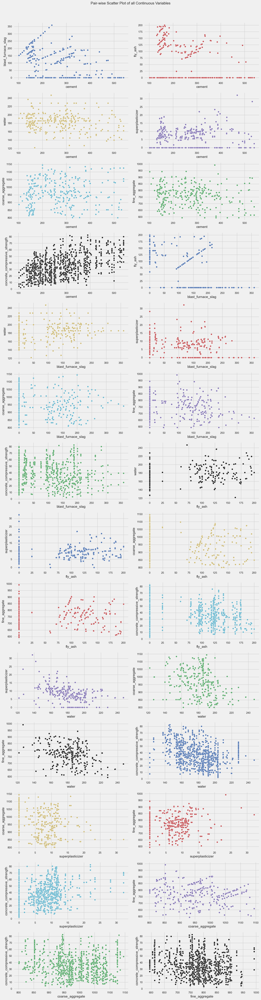

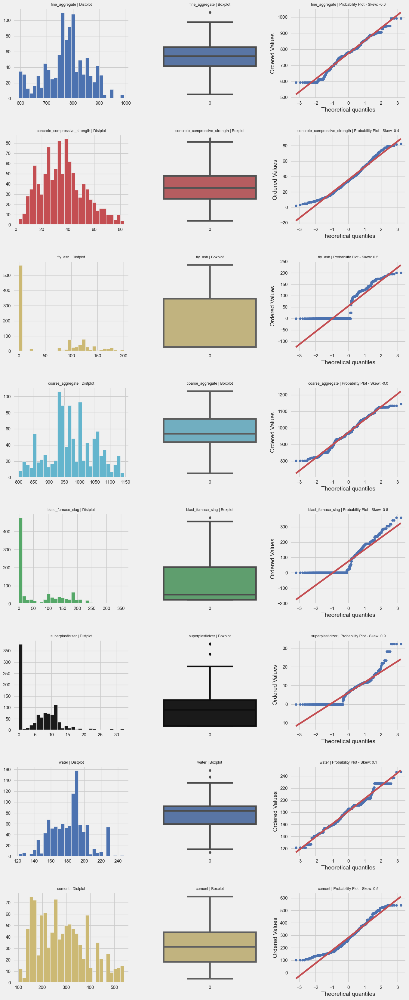

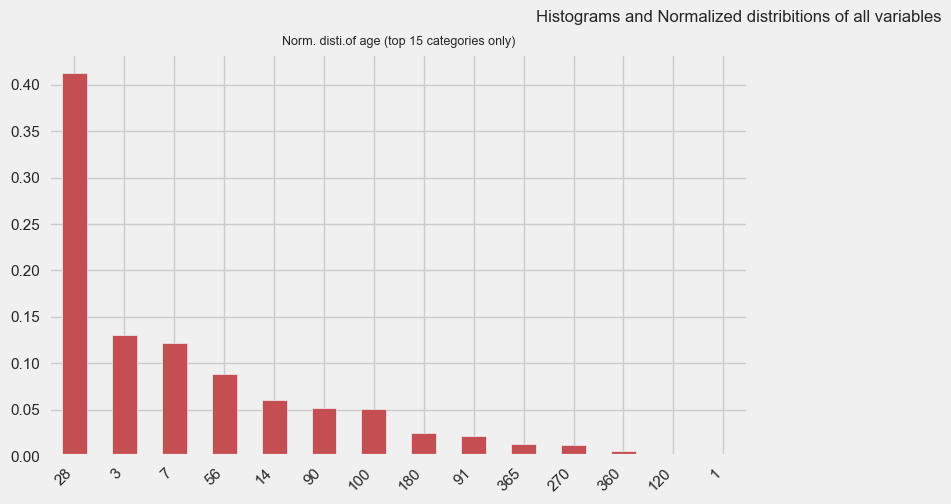

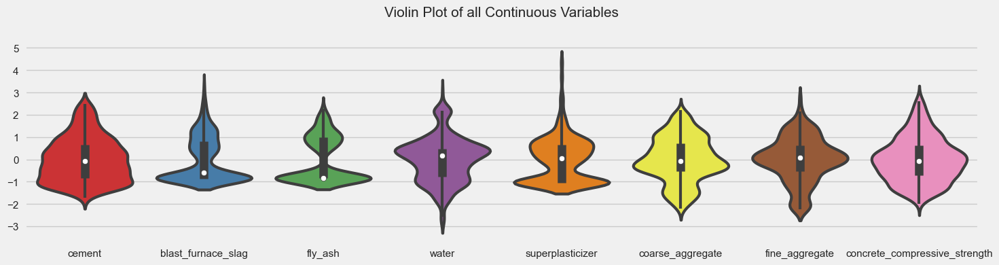

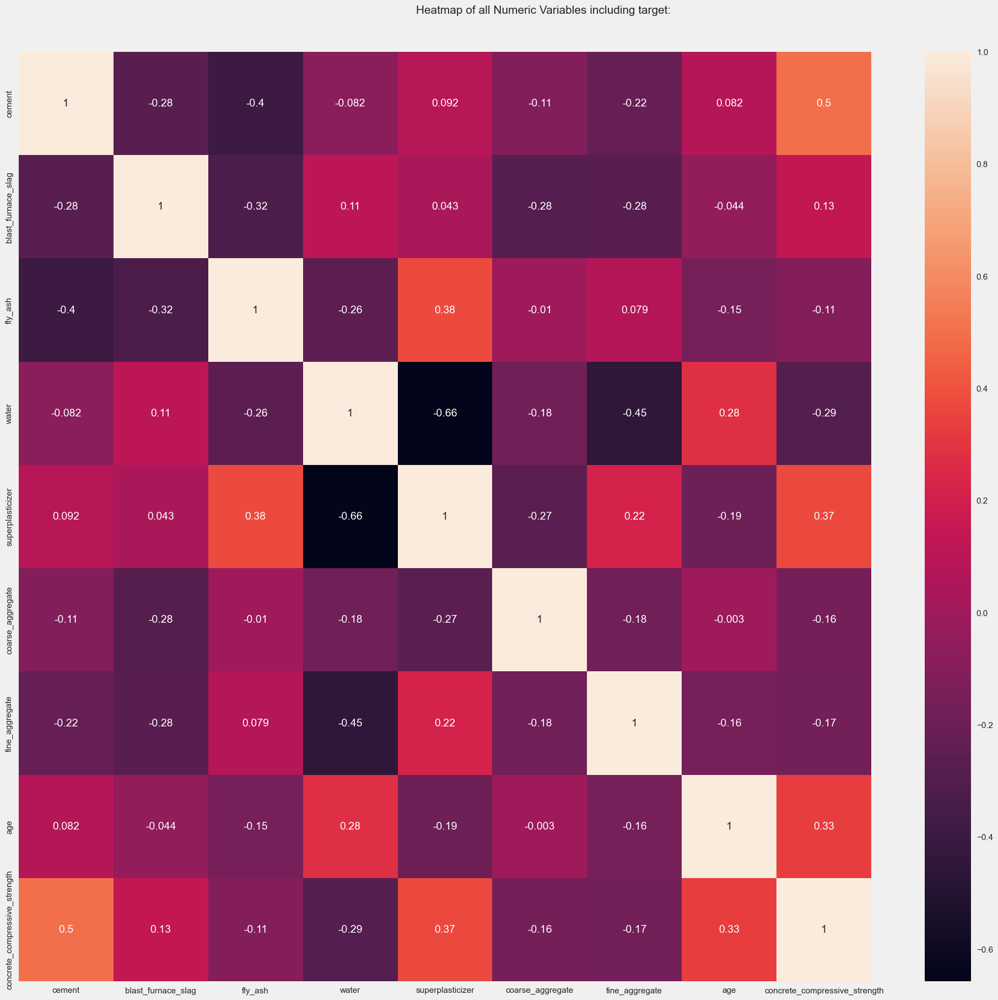

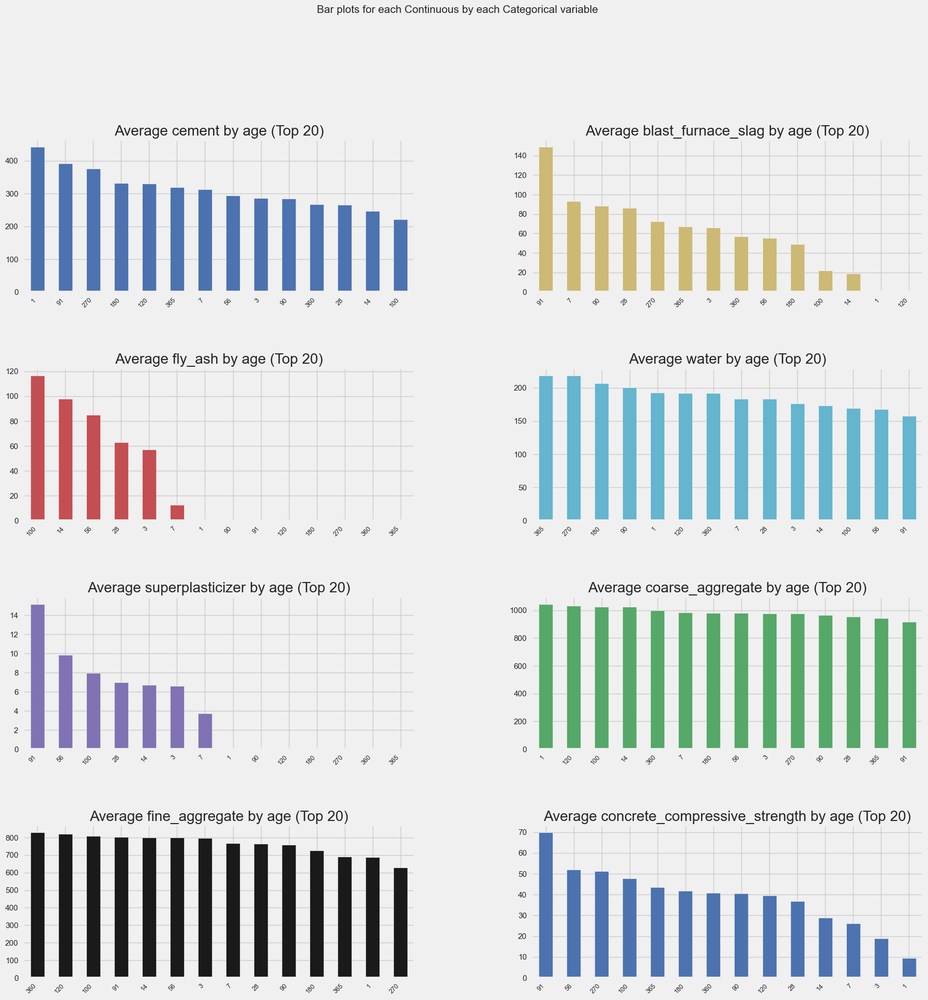

All Plots done
Time to run AutoViz = 20 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [8]:
%matplotlib inline

from autoviz.AutoViz_Class import AutoViz_Class

plt.figure(figsize=(10, 5))
AV = AutoViz_Class()
df_av = AV.AutoViz(r"D:\INeuron_Projects\Concrete_Com Test Pred\concrete_data.csv")

plt.show()

##### After analyzing the dataset, several observations were made:

1. Duplicate Rows: The dataset contains 11 duplicate rows, accounting for 1.1% of the total data. It is recommended to handle these duplicates to ensure accurate analysis.

2. Correlation: There is a strong positive correlation between water and superplasticizer variables. Similarly, age shows a high correlation with concrete compressive strength. These relationships indicate that changes in one variable may significantly impact the other.

3. Zeros: The variables blast_furnace_slag, fly_ash, and superplasticizer have a considerable number of zeros. These zeros may have implications for the analysis, and further investigation is required to understand their significance.

4. Outliers: The box plot analysis revealed the presence of outliers in the dataset. These outliers represent data points that significantly deviate from the majority of the data and may warrant further investigation to determine their impact on the analysis.

Considering these findings, further data preprocessing steps, such as handling duplicates, addressing zero values, and outlier treatment, should be performed to ensure the accuracy and reliability of the analysis.

In [9]:
# remow dupicate rows

df = df.drop_duplicates()

In [10]:
# copies of data useful for further models and invistegation

df1 = df.copy()


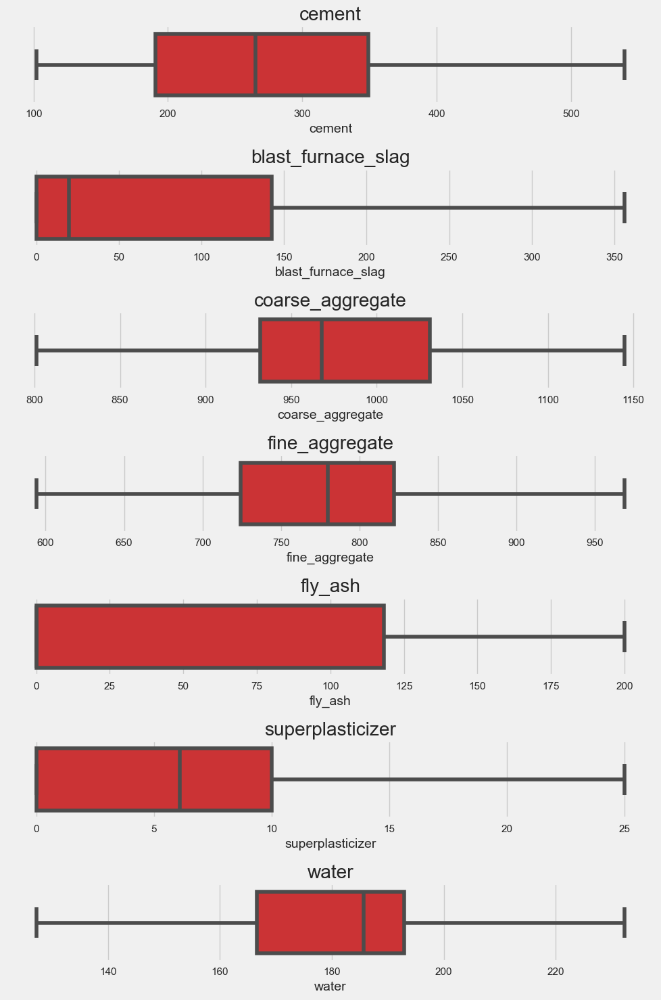

In [16]:
from feature_engine.outliers import Winsorizer

# Select the features to apply Winsorization
features = ['cement', 'blast_furnace_slag', 'coarse_aggregate', 'fine_aggregate', 'fly_ash', 'superplasticizer', 'water']

# Create the Winsorizer transformer
winsorizer = Winsorizer(capping_method='iqr', tail='both', fold=1.5, variables=features)

# Fit and transform the data
df[features] = winsorizer.fit_transform(df[features])

# Set the size of the figure
plt.figure(figsize=(10, 15))

# For each feature, create a subplot and draw a boxplot
for i, feature in enumerate(features, 1):
    plt.subplot(len(features), 1, i)
    sns.boxplot(x=df[feature])
    plt.title(feature)

# Display the plot
plt.tight_layout()
plt.show()  

In [17]:
# check outliers in each feature 

features = ['cement', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer', 'coarse_aggregate', 'age']

# Calculate the lower and upper fences for outliers
for feature in features:
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_fence = Q1 - 1.5 * IQR
    upper_fence = Q3 + 1.5 * IQR

    # Count the number of outliers below the lower fence
    lower_outliers_count = df[df[feature] < lower_fence].shape[0]
    
    # Count the number of outliers above the upper fence
    upper_outliers_count = df[df[feature] > upper_fence].shape[0]

    print("Feature:", feature)
    print("Number of Lower Outliers:", lower_outliers_count)
    print("Number of Upper Outliers:", upper_outliers_count)
    print("-------------------------------------------")#

Feature: cement
Number of Lower Outliers: 0
Number of Upper Outliers: 0
-------------------------------------------
Feature: blast_furnace_slag
Number of Lower Outliers: 0
Number of Upper Outliers: 0
-------------------------------------------
Feature: fly_ash
Number of Lower Outliers: 0
Number of Upper Outliers: 0
-------------------------------------------
Feature: water
Number of Lower Outliers: 0
Number of Upper Outliers: 0
-------------------------------------------
Feature: superplasticizer
Number of Lower Outliers: 0
Number of Upper Outliers: 0
-------------------------------------------
Feature: coarse_aggregate
Number of Lower Outliers: 0
Number of Upper Outliers: 0
-------------------------------------------
Feature: age
Number of Lower Outliers: 0
Number of Upper Outliers: 59
-------------------------------------------


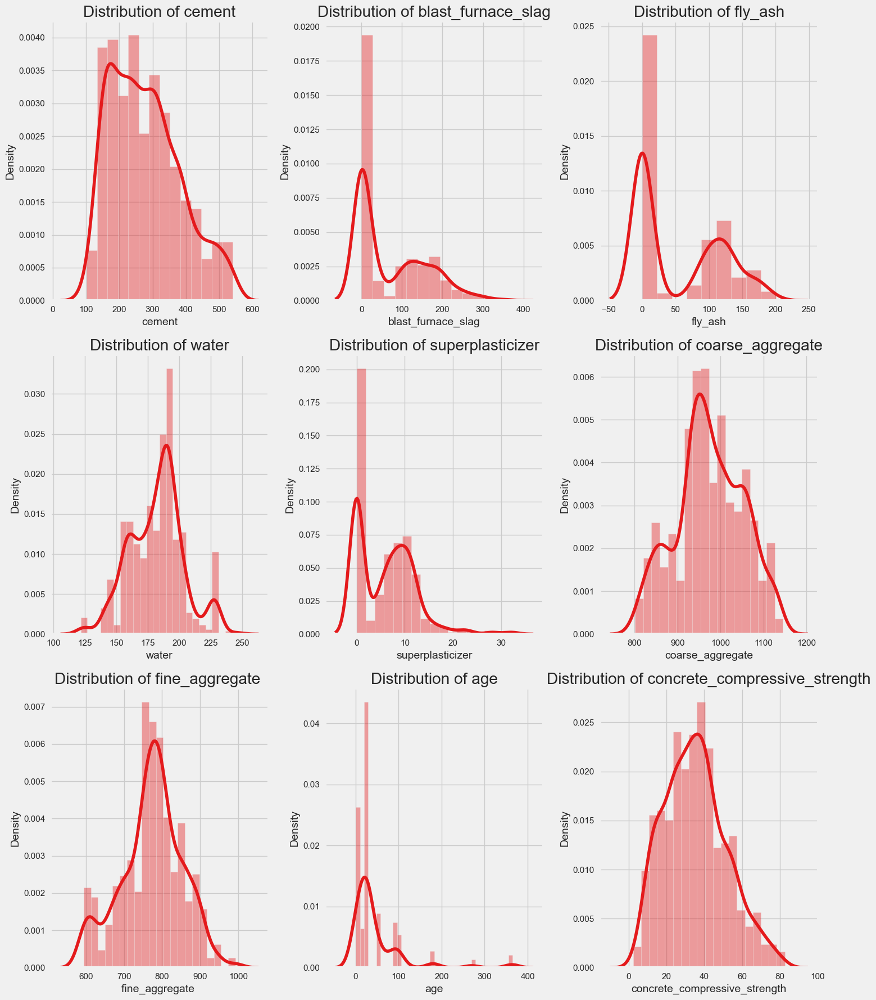

In [207]:
features = ['cement', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer', 'coarse_aggregate', 'fine_aggregate ', 'age', 'concrete_compressive_strength']

num_plots = len(features)
num_rows = num_plots // 3 + num_plots % 3

fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 6 * num_rows))

for i, feature in enumerate(features):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    sns.distplot(df[feature], kde=True, ax=ax)
    ax.set_title(f"Distribution of {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("Density")

# Remove any unused subplots
if num_plots % 3 != 0:
    for j in range(num_plots % 3, 3):
        fig.delaxes(axes[num_rows - 1, j])

plt.tight_layout()
plt.show()

Null Hypothesis (H0): The hypothesis that there is no significant difference or effect. In statistics, we usually assume the null hypothesis is true until we have enough evidence to reject it.

Alternative Hypothesis (Ha or H1): The hypothesis that there is a significant difference or effect. This is the hypothesis we are testing for, and it's considered as an alternative to the null hypothesis.

In the context of the Shapiro-Wilk test:

H0: "The data is drawn from a normal distribution."

Ha: "The data is not drawn from a normal distribution."

We use statistical tests to determine whether to reject the null hypothesis in favor of the alternative hypothesis. If the p-value is less than a chosen significance level (commonly 0.05), we reject the null hypothesis and conclude that the data is not normally distributed.

Feature: cement
Test statistic = 0.9779785871505737
p-value = 3.3278435562777986e-11
Data does not appear to be normally distributed.

Feature: blast_furnace_slag
Test statistic = 0.6973791718482971
p-value = 4.7765093857499655e-39
Data does not appear to be normally distributed.

Feature: fly_ash
Test statistic = 0.6571615934371948
p-value = 7.958254238593501e-41
Data does not appear to be normally distributed.

Feature: water
Test statistic = 0.9717737436294556
p-value = 4.563163540603765e-13
Data does not appear to be normally distributed.

Feature: superplasticizer
Test statistic = 0.7259781360626221
p-value = 1.1599685243569543e-37
Data does not appear to be normally distributed.

Feature: coarse_aggregate
Test statistic = 0.9790487289428711
p-value = 7.527087286796075e-11
Data does not appear to be normally distributed.

Feature: fine_aggregate
Test statistic = 0.9643646478652954
p-value = 5.79748566726301e-15
Data does not appear to be normally distributed.

Feature: age
Test st

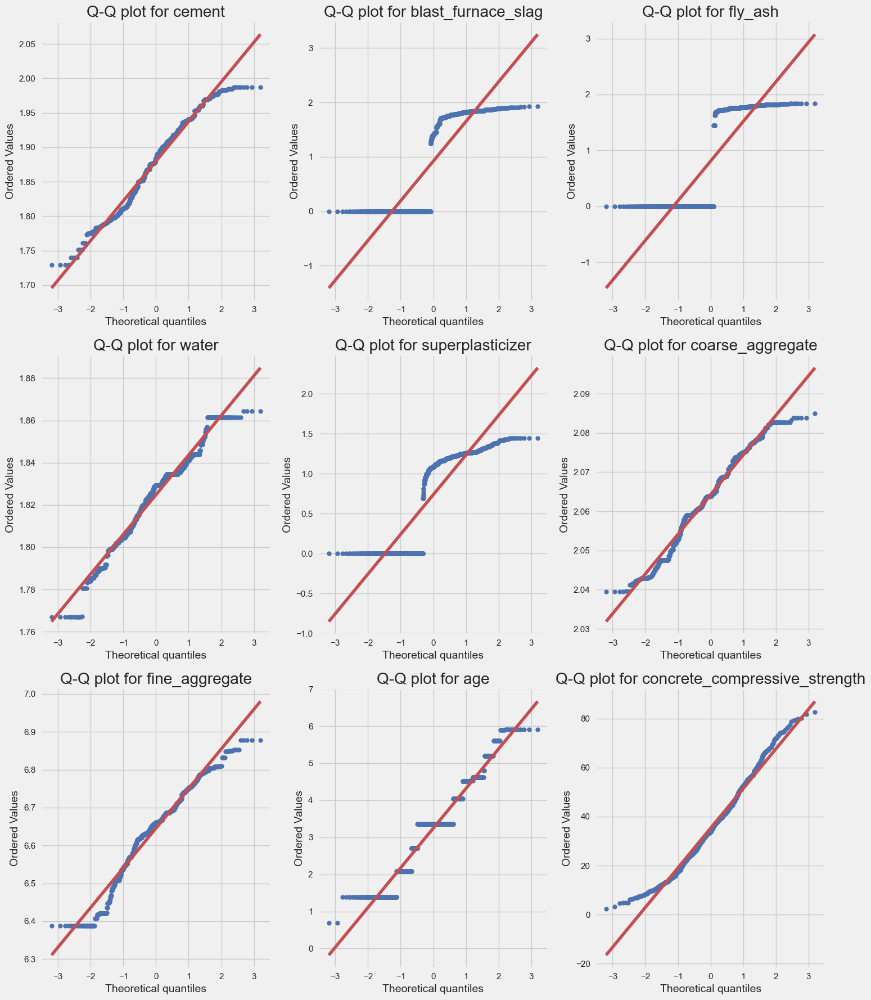

In [32]:
features = ['cement', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer', 
            'coarse_aggregate', 'fine_aggregate', 'age', 'concrete_compressive_strength']

num_plots = len(features)
num_rows = num_plots // 3 + num_plots % 3

fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 6 * num_rows))

for i, feature in enumerate(features):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    
    data = df[feature]
    
    # perform Shapiro-Wilk test
    stat, p = stats.shapiro(data)
    
    # print test statistic and p-value
    print(f'Feature: {feature}')
    print('Test statistic =', stat)
    print('p-value =', p)
    
    if p > 0.05:
        print('Data appears to be normally distributed.\n')
    else:
        print('Data does not appear to be normally distributed.\n')
    
    # generate Q-Q plot in subplot
    stats.probplot(data, plot=ax)
    ax.set_title('Q-Q plot for ' + feature)

# Remove any unused subplots
if num_plots % 3 != 0:
    for j in range(num_plots % 3, 3):
        fig.delaxes(axes[num_rows - 1, j])

plt.tight_layout()
plt.show()


In [19]:
# Specify the features to apply log transformation
features = ['cement', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer',
       'coarse_aggregate', 'fine_aggregate', 'age'
       ]

# Apply log transformation to the selected features
for feature in features:
    df[feature] = np.log1p(df[feature])

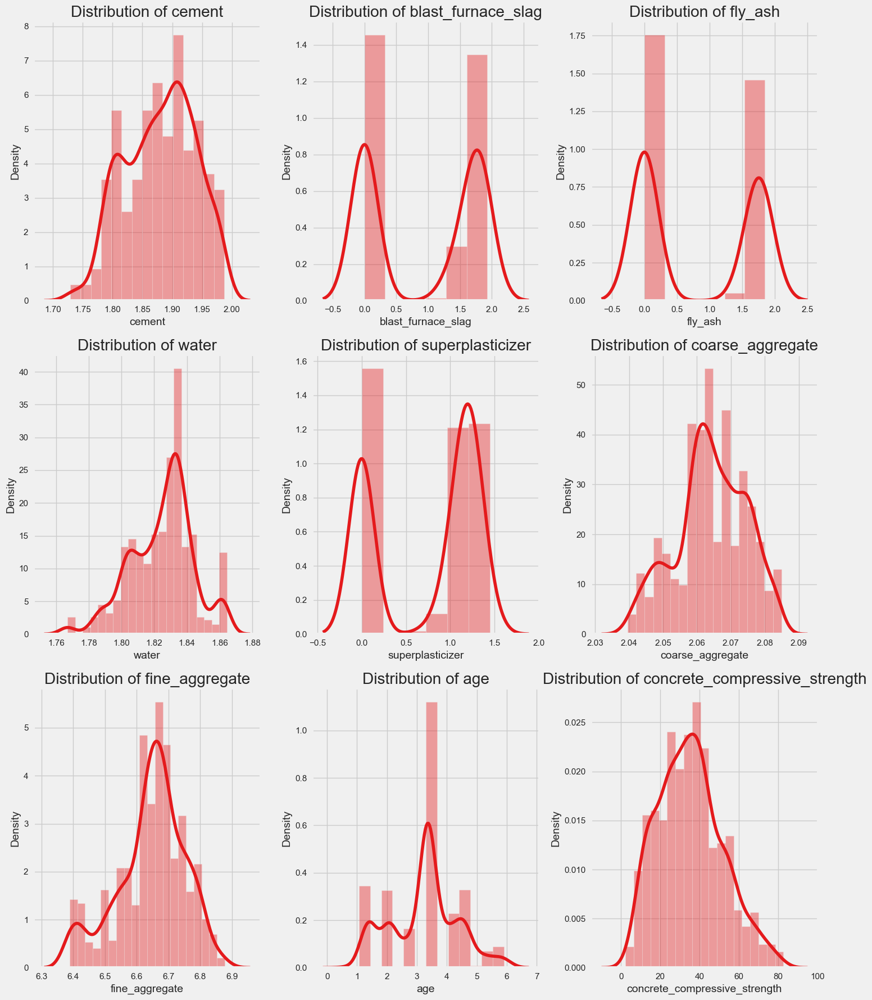

In [20]:
features = ['cement', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer', 'coarse_aggregate', 'fine_aggregate', 'age', 'concrete_compressive_strength']

num_plots = len(features)
num_rows = num_plots // 3 + num_plots % 3

fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 6 * num_rows))

for i, feature in enumerate(features):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    sns.distplot(df[feature], kde=True, ax=ax)
    ax.set_title(f"Distribution of {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("Density")

# Remove any unused subplots
if num_plots % 3 != 0:
    for j in range(num_plots % 3, 3):
        fig.delaxes(axes[num_rows - 1, j])

plt.tight_layout()
plt.show()

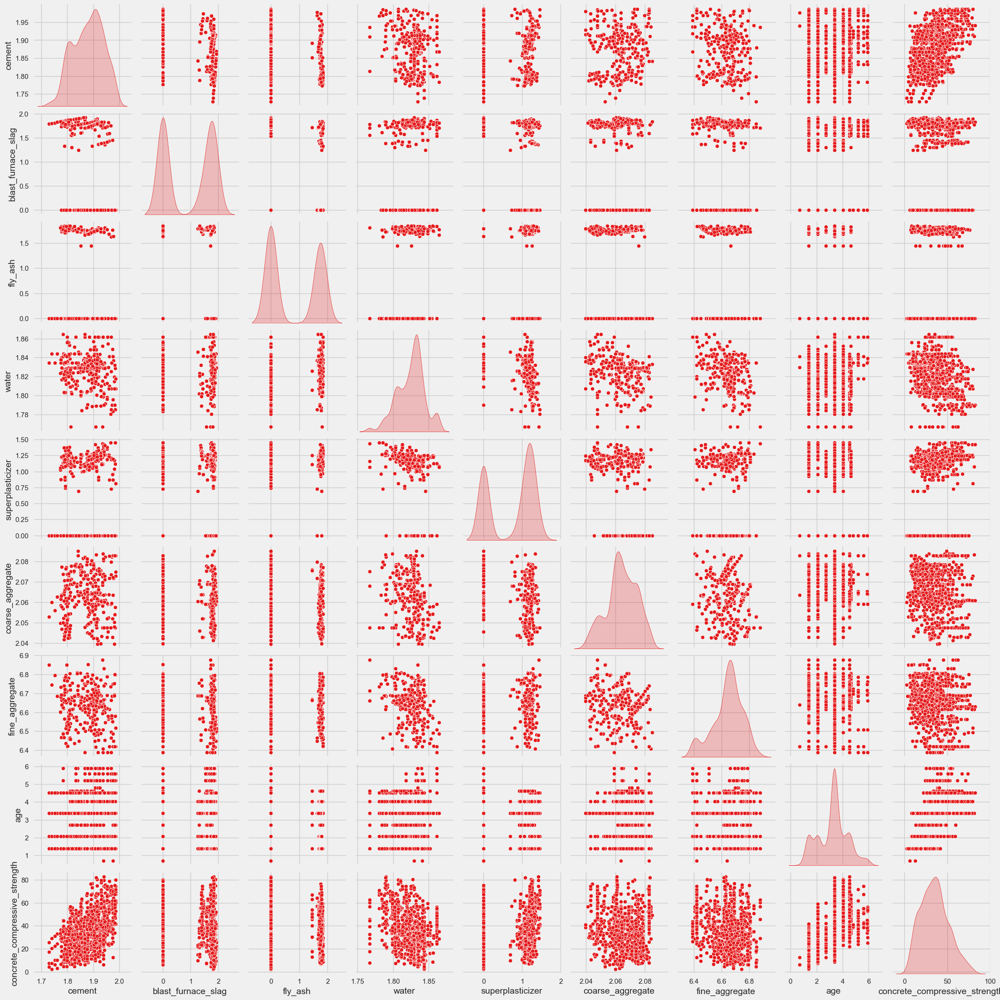

In [21]:
sns.pairplot(df, diag_kind='kde')
plt.show()

In [22]:
X = df.drop(['concrete_compressive_strength'], axis=1)
y = df['concrete_compressive_strength']

# train test split the data

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=9)

# Print the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (804, 8)
y_train shape: (804,)
X_test shape: (201, 8)
y_test shape: (201,)


# Linear Models

In [35]:
# Create a LinearRegression model
linear_model = LinearRegression()

# Fit the model on the training data
linear_model.fit(X_train, y_train)

# Make predictions on the training and test sets
linear_ypred_train = linear_model.predict(X_train)
linear_ypred_test = linear_model.predict(X_test)

# Calculate the RMSE and R2 score for the test set
linear_rmse_test = mean_squared_error(y_test, linear_ypred_test, squared=False)
linear_r2_test = r2_score(y_test, linear_ypred_test)
linear_r2_train = r2_score(y_train, linear_ypred_train)
# Perform k-fold cross-validation
k = 5
kfold_linear = KFold(n_splits=k, random_state=42, shuffle=True)
cv_linear = cross_val_score(linear_model, X, y, cv=kfold_linear, scoring='r2')

# Print the results
print("Linear Regression (Train) - R^2:", linear_r2_train)
print("Linear Regression (Test) - R^2:", linear_r2_test)
print("Linear Regression (Test) - RMSE:", linear_rmse_test)
print("Linear Regression CV Score Mean (R^2):", cv_linear.mean())

Linear Regression (Train) - R^2: 0.7925995842681175
Linear Regression (Test) - R^2: 0.7900841279607375
Linear Regression (Test) - RMSE: 7.34931299244433
Linear Regression CV Score Mean (R^2): 0.789028441790786


In [36]:
# L1 (Lasso) Regression

lasso_model = Lasso(alpha=0.1)
lasso_model.fit(X_train, y_train)
lasso_ypred_train = lasso_model.predict(X_train)
lasso_ypred_test = lasso_model.predict(X_test)
lasso_r2_train = r2_score(y_train, lasso_ypred_train)
lasso_r2_test = r2_score(y_test, lasso_ypred_test)
lasso_coeffs = lasso_model.coef_

print("Lasso Regression (Train) - R^2:", lasso_r2_train)
print("Lasso Regression (Test) - R^2:", lasso_r2_test)
print("Lasso Coeffecients : ", lasso_coeffs)


# L2 (Ridge) Regression
ridge_model = Ridge(alpha=0.1)  # Adjust alpha as needed
ridge_model.fit(X_train, y_train)
ridge_predictions_train = ridge_model.predict(X_train)
ridge_predictions_test = ridge_model.predict(X_test)
ridge_rmse_test = mean_squared_error(y_test, ridge_predictions_test, squared=False)
ridge_r2_train = r2_score(y_train, ridge_predictions_train)
ridge_r2_test = r2_score(y_test, ridge_predictions_test)

# Elastic Net Regression
elastic_model = ElasticNet(alpha=0.1, l1_ratio=0.5)  # Adjust alpha and l1_ratio as needed
elastic_model.fit(X_train, y_train)
elastic_predictions_train = elastic_model.predict(X_train)
elastic_predictions_test = elastic_model.predict(X_test)
elastic_rmse_test = mean_squared_error(y_test, elastic_predictions_test, squared=False)
elastic_r2_train = r2_score(y_train, elastic_predictions_train)
elastic_r2_test = r2_score(y_test, elastic_predictions_test)



print("Ridge Regression (Train) - R^2:", ridge_r2_train)
print("Ridge Regression (Test) - R^2:", ridge_r2_test)
print("Ridge Regression (Test) - RMSE:", ridge_rmse_test)
print("Elastic Net Regression (Train) - R^2:", elastic_r2_train)
print("Elastic Net Regression (Test) - R^2:", elastic_r2_test)
print("Elastic Net Regression (Test) - RMSE:", elastic_rmse_test)

Lasso Regression (Train) - R^2: 0.7361357887828031
Lasso Regression (Test) - R^2: 0.7483985712589172
Lasso Coeffecients :  [117.62391316   4.20804023  -2.51811787  -0.          11.59923562
   0.          -0.           8.40388789]
Ridge Regression (Train) - R^2: 0.7859569375831417
Ridge Regression (Test) - R^2: 0.783103843405847
Ridge Regression (Test) - RMSE: 7.470506242015733
Elastic Net Regression (Train) - R^2: 0.5351507466786456
Elastic Net Regression (Test) - R^2: 0.5601327202340052
Elastic Net Regression (Test) - RMSE: 10.638611104911842


In [37]:
# Polynomial Regression
degree = 3  # Adjust the degree as needed
poly_features = PolynomialFeatures(degree=degree, include_bias=False)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

poly_model = LinearRegression()
poly_model.fit(X_train_poly, y_train)

poly_predictions_train = poly_model.predict(X_train_poly)  # Generate predictions on the training dataset
poly_predictions = poly_model.predict(X_test_poly)

poly_rmse = mean_squared_error(y_test, poly_predictions, squared=False)
poly_r2_test = r2_score(y_test, poly_predictions)
poly_r2_train = r2_score(y_train, poly_predictions_train)  # Compute R^2 score on the training dataset


# K Fold Cross Validation

X_poly = poly_features.fit_transform(X)

k = 5 
kfold_ploy = KFold(n_splits=k, random_state= 42, shuffle=True)
CV_score_poly = cross_val_score(poly_model,X_poly,y, scoring='r2', cv=kfold_ploy)



# Print the evaluation metrics
print("Polynomial Regression (Degree", degree, ") - RMSE:", poly_rmse)
print("Polynomial Regression (Degree", degree, ") - Train - R^2:", poly_r2_train)
print("Polynomial Regression (Degree", degree, ") - Test - R^2:", poly_r2_test)
print("CV_Score : ",CV_score_poly.mean())

Polynomial Regression (Degree 3 ) - RMSE: 4.955658467496733
Polynomial Regression (Degree 3 ) - Train - R^2: 0.9484633099482782
Polynomial Regression (Degree 3 ) - Test - R^2: 0.9045547045211716
CV_Score :  0.8035154458855788


In [38]:
degree = 3

# Create polynomial features
poly_features = PolynomialFeatures(degree=degree, include_bias=False)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

# Create Lasso regression model with L1 regularization
lasso_model = Lasso(alpha=0.1, max_iter=1000)  # Adjust the alpha and max_iter values as needed
lasso_model.fit(X_train_poly, y_train)
lasso_predictions = lasso_model.predict(X_test_poly)
lasso_rmse = mean_squared_error(y_test, lasso_predictions, squared=False)
lasso_r2 = r2_score(y_test, lasso_predictions)

# Create Ridge regression model with L2 regularization
ridge_model = Ridge(alpha=0.1)  # Adjust the alpha value as needed
ridge_model.fit(X_train_poly, y_train)
ridge_predictions = ridge_model.predict(X_test_poly)
ridge_rmse = mean_squared_error(y_test, ridge_predictions, squared=False)
ridge_r2 = r2_score(y_test, ridge_predictions)

# Perform k-fold cross-validation with Lasso and Ridge models
k = 5
kfold = KFold(n_splits=k, shuffle=True, random_state=42)

lasso_cv_scores = cross_val_score(lasso_model, X_train_poly, y_train, scoring='r2', cv=kfold)
ridge_cv_scores = cross_val_score(ridge_model, X_train_poly, y_train, scoring='r2', cv=kfold)

# Print the evaluation metrics
print("Polynomial Regression (Degree", degree, ") - RMSE (Lasso):", lasso_rmse)
print("Polynomial Regression (Degree", degree, ") - R^2 (Lasso):", lasso_r2)
print("Polynomial Regression (Degree", degree, ") - RMSE (Ridge):", ridge_rmse)
print("Polynomial Regression (Degree", degree, ") - R^2 (Ridge):", ridge_r2)
print("Lasso Regression CV Score:", lasso_cv_scores.mean())
print("Ridge Regression CV Score:", ridge_cv_scores.mean())


Polynomial Regression (Degree 3 ) - RMSE (Lasso): 6.74448381429475
Polynomial Regression (Degree 3 ) - R^2 (Lasso): 0.8232134486282252
Polynomial Regression (Degree 3 ) - RMSE (Ridge): 6.206340299512778
Polynomial Regression (Degree 3 ) - R^2 (Ridge): 0.8502996003362743
Lasso Regression CV Score: 0.8399145021762797
Ridge Regression CV Score: 0.8747372732055847


In [39]:
#XG boost

xgb_model = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators=100)



# Fit the model
xgb_model.fit(X_train, y_train)

# Make predictions
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_train = r2_score(y_train, xgb_ypred_train)
xgb_r2_test = r2_score(y_test, xgb_ypred_test)

# Perform  k fold cross-validation on XGBoost Regression
k = 5 
kfold_XG = KFold(n_splits=k, random_state= 42, shuffle=True)
CV_score_XG = cross_val_score(xgb_model,X,y, scoring='r2', cv=kfold_XG)



print("XGBoost Regression (Train) - R^2:", xgb_r2_train)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test)
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression CV Score :", CV_score_XG.mean())

XGBoost Regression (Train) - R^2: 0.9960415721489488
XGBoost Regression (Test) - R^2: 0.9311340549257805
XGBoost Regression (Test) - RMSE: 4.209459744802385
XGBoost Regression CV Score : 0.932439151630567


In [217]:
from sklearn.model_selection import GridSearchCV

# Define a parameter grid
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1, 10],
    'lambda': [0.001, 0.01, 0.1, 1, 10],
    'gamma': [0.001, 0.01, 0.1, 1, 10],
    'n_estimators': [50, 100],
    'max_depth': [2, 4, 6]
}

# Initialize an XGBoost Regressor
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)

# Print the best parameters
print(grid_search.best_params_)


Fitting 5 folds for each of 750 candidates, totalling 3750 fits
{'alpha': 0.01, 'gamma': 0.01, 'lambda': 1, 'max_depth': 6, 'n_estimators': 50}


In [218]:
from sklearn.model_selection import RandomizedSearchCV

# Initialize the RandomizedSearchCV object
rand_search = RandomizedSearchCV(estimator=xgb_model, param_distributions=param_grid, cv=5, n_iter=50, n_jobs=-1, verbose=2)

# Fit the RandomizedSearchCV object to the data
rand_search.fit(X_train, y_train)

# Print the best parameters
print(rand_search.best_params_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 100, 'max_depth': 4, 'lambda': 1, 'gamma': 0.01, 'alpha': 0.001}


In [40]:
# remodeling according to Gridsearch CV 
xgb_model = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators=100, reg_alpha=1, reg_lambda=10, gamma=0.01, max_depth=4)



# Fit the model
xgb_model.fit(X_train, y_train)

# Make predictions
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_train_remodel_grid = r2_score(y_train, xgb_ypred_train)
xgb_r2_test_remodel_grid = r2_score(y_test, xgb_ypred_test)

# Perform cross-validation on XGBoost Regression
k = 5 
kfold_XG_remodel_grid = KFold(n_splits=k, random_state= 42, shuffle=True)
CV_score_XG_remodel_grid = cross_val_score(xgb_model,X,y, scoring='r2', cv=kfold_XG_remodel_grid)


print("XGBoost Regression (Train) - R^2:", xgb_r2_train_remodel_grid)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test_remodel_grid)
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression CV Score :", CV_score_XG_remodel_grid.mean())

XGBoost Regression (Train) - R^2: 0.9823273202290895
XGBoost Regression (Test) - R^2: 0.9215236065330772
XGBoost Regression (Test) - RMSE: 4.493591845673046
XGBoost Regression CV Score : 0.9271543843681224


In [29]:
# remodeling according to randomsearch CV


xgb_model = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators=50, reg_alpha=0.1, reg_lambda=10, gamma=0.01, max_depth=6)



# Fit the model
xgb_model.fit(X_train, y_train)

# Make predictions
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_train = r2_score(y_train, xgb_ypred_train)
xgb_r2_test = r2_score(y_test, xgb_ypred_test)

# Perform cross-validation on XGBoost Regression
xgb_cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='r2')

print("XGBoost Regression (Train) - R^2:", xgb_r2_train)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test)
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression Cross-Validation (R^2):", xgb_cv_scores)
print("XGBoost Regression CV Score :", xgb_cv_scores.mean())

XGBoost Regression (Train) - R^2: 0.9856491019155629
XGBoost Regression (Test) - R^2: 0.9184518125777225
XGBoost Regression (Test) - RMSE: 4.580693789154709
XGBoost Regression Cross-Validation (R^2): [ 0.56107538  0.62228415  0.7204144   0.74886107 -0.26981147]
XGBoost Regression CV Score : 0.47656470442122584


In [41]:
# remodeling according to randomsearch CV


xgb_model = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators=100, reg_alpha=0.1, reg_lambda=10, gamma=0.01, max_depth=4)



# Fit the model
xgb_model.fit(X_train, y_train)

# Make predictions
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_train_remodel_random = r2_score(y_train, xgb_ypred_train)
xgb_r2_test_remodel_random = r2_score(y_test, xgb_ypred_test)

# Perform cross-validation on XGBoost Regression
k = 5 
kfold_XG_remodel_random = KFold(n_splits=k, random_state= 42, shuffle=True)
CV_score_XG_remodel_random = cross_val_score(xgb_model,X,y, scoring='r2', cv=kfold_XG_remodel_random)


print("XGBoost Regression (Train) - R^2:", xgb_r2_train_remodel_random)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test_remodel_random)
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression CV Score :", CV_score_XG_remodel_random.mean())

XGBoost Regression (Train) - R^2: 0.9828032275648817
XGBoost Regression (Test) - R^2: 0.918973439068376
XGBoost Regression (Test) - RMSE: 4.5660199836157345
XGBoost Regression CV Score : 0.9281685715158632


#### Split data into Train Test Valid 

In [42]:
# copy of df to df_copy 
df_copy = df.copy()


In [43]:
Xcopy = df.drop(['concrete_compressive_strength'], axis=1)
ycopy = df['concrete_compressive_strength']

# Split the data into a temporary train set and a final test set
Xcopy_temp, Xcopy_test, ycopy_temp, ycopy_test = train_test_split(Xcopy, ycopy, test_size=0.2, random_state=42)

# Then split the temporary set into final train and validation sets
Xcopy_train, Xcopy_val, ycopy_train, ycopy_val = train_test_split(Xcopy_temp, ycopy_temp, test_size=0.25, random_state=42)

# Now we have training, validation, and test sets



print("Xcopy_train shape:", Xcopy_train.shape)
print("ycopy_train shape:", ycopy_train.shape)
print("Xcopy_val shape:", Xcopy_val.shape)
print("ycopy_val shape:", ycopy_val.shape)
print("Xcopy_test shape:", Xcopy_test.shape)
print("ycopy_test shape:", ycopy_test.shape)


Xcopy_train shape: (603, 8)
ycopy_train shape: (603,)
Xcopy_val shape: (201, 8)
ycopy_val shape: (201,)
Xcopy_test shape: (201, 8)
ycopy_test shape: (201,)


In [44]:
# Initialize the XGBoost Regressor with the selected parameters
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=50, reg_alpha=0.1, reg_lambda=10, gamma=0.01, max_depth=6)

# Fit the model on the training set
xgb_model.fit(Xcopy_train, ycopy_train)

# Predict on training and validation sets
xgb_ypred_train = xgb_model.predict(Xcopy_train)
xgb_ypred_val = xgb_model.predict(Xcopy_val)

# Calculate metrics for the training and validation sets
xgb_rmse_val = mean_squared_error(ycopy_val, xgb_ypred_val, squared=False)
xgb_r2_train = r2_score(ycopy_train, xgb_ypred_train)
xgb_r2_val = r2_score(ycopy_val, xgb_ypred_val)

print("XGBoost Regression (Train) - R^2:", xgb_r2_train)
print("XGBoost Regression (Validation) - R^2:", xgb_r2_val)
print("XGBoost Regression (Validation) - RMSE:", xgb_rmse_val)

# Predict on the test set
xgb_ypred_test = xgb_model.predict(Xcopy_test)

# Calculate metrics for the test set
xgb_rmse_test = mean_squared_error(ycopy_test, xgb_ypred_test, squared=False)
xgb_r2_test = r2_score(ycopy_test, xgb_ypred_test)

print("XGBoost Regression (Test) - R^2:", xgb_r2_test)
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)

XGBoost Regression (Train) - R^2: 0.9882951177169724
XGBoost Regression (Validation) - R^2: 0.9187064951900842
XGBoost Regression (Validation) - RMSE: 4.429901441824419
XGBoost Regression (Test) - R^2: 0.8938393352461491
XGBoost Regression (Test) - RMSE: 5.627643254142302


In [45]:
# polynomial regression for df_copy and train test valid data




degree = 3  # Adjust the degree as needed
poly_features = PolynomialFeatures(degree=3)

# Transform the features for train, validation, and test sets
Xcopy_train_poly = poly_features.fit_transform(Xcopy_train)
Xcopy_val_poly = poly_features.transform(Xcopy_val)
Xcopy_test_poly = poly_features.transform(Xcopy_test)

# Fit the polynomial regression model on the transformed training set
poly_model = LinearRegression()
poly_model.fit(Xcopy_train_poly, ycopy_train)

# Predict on the training, validation, and test sets
poly_predictions_train = poly_model.predict(Xcopy_train_poly)
poly_predictions_val = poly_model.predict(Xcopy_val_poly)
poly_predictions_test = poly_model.predict(Xcopy_test_poly)

# Calculate metrics for training set
poly_rmse_train = mean_squared_error(ycopy_train, poly_predictions_train, squared=False)
poly_r2_train = r2_score(ycopy_train, poly_predictions_train)

# Calculate metrics for validation set
poly_rmse_val = mean_squared_error(ycopy_val, poly_predictions_val, squared=False)
poly_r2_val = r2_score(ycopy_val, poly_predictions_val)

# Calculate metrics for test set
poly_rmse_test = mean_squared_error(ycopy_test, poly_predictions_test, squared=False)
poly_r2_test = r2_score(ycopy_test, poly_predictions_test)

# Print the evaluation metrics
print("Polynomial Regression (Degree", degree, ") - RMSE (Train):", poly_rmse_train)
print("Polynomial Regression (Degree", degree, ") - R^2 (Train):", poly_r2_train)
print("Polynomial Regression (Degree", degree, ") - RMSE (Validation):", poly_rmse_val)
print("Polynomial Regression (Degree", degree, ") - R^2 (Validation):", poly_r2_val)
print("Polynomial Regression (Degree", degree, ") - RMSE (Test):", poly_rmse_test)
print("Polynomial Regression (Degree", degree, ") - R^2 (Test):", poly_r2_test)


Polynomial Regression (Degree 3 ) - RMSE (Train): 3.3878722781123294
Polynomial Regression (Degree 3 ) - R^2 (Train): 0.9559424320069652
Polynomial Regression (Degree 3 ) - RMSE (Validation): 6.988351813960399
Polynomial Regression (Degree 3 ) - R^2 (Validation): 0.7976900509206938
Polynomial Regression (Degree 3 ) - RMSE (Test): 9.276032351921048
Polynomial Regression (Degree 3 ) - R^2 (Test): 0.7115735924676383


### OLS and VIF

In [46]:
import statsmodels.formula.api as smf

model1 = smf.ols("y~X", data=df).fit()
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.791
Method:                 Least Squares   F-statistic:                     476.9
Date:                Sat, 03 Jun 2023   Prob (F-statistic):               0.00
Time:                        01:32:15   Log-Likelihood:                -3438.3
No. Observations:                1005   AIC:                             6895.
Df Residuals:                     996   BIC:                             6939.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    494.4636    127.677      3.873      0.000     243.916     745.011
X[0]         136.7638      5.963     22.936      0.000     125.063     148.465
X[1]           4.8152      0.415     11.600      0.000       4.001       5.630
X[2]          -0.4810      0.445     -1.082      0.280      -1.354       0.392
X[3]        -270.7680     22.634    -11.963      0.000    -315.184    -226.352
X[4]           5.0038      0.763      6.558      0.000       3.506       6.501
X[5]         -68.9676     34.909     -1.976      0.048    -137.470      -0.465
X[6]         -17.4525      3.539     -4.932      0.000     -24.396     -10.509
X[7]           8.7599      0.215     40.662      0.000       8.337       9.183
==============================================================================
Omnibus:                       17.237   Durbin-Watson:                   1.294
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               26.551
Skew:                           0.140   Prob(JB):                     1.72e-06
Kurtosis:                       3.745   Cond. No.                     4.72e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.72e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [55]:

from statsmodels.stats.outliers_influence import variance_inflation_factor


#Select the independent variables
independent_vars = ['cement', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer',
                    'coarse_aggregate', 'fine_aggregate', 'age']

# Calculate VIF for each independent variable
vif_data = pd.DataFrame(columns=['Variable', 'VIF'])

for var in independent_vars:
    formula = f"{var} ~ {' + '.join([v for v in independent_vars if v != var])}"
    rsquared = smf.ols(formula, data=df).fit().rsquared
    vif = 1 / (1 - rsquared)
    vif_data = vif_data.append({'Variable': var, 'VIF': vif}, ignore_index=True)

# Print the VIF DataFrame
print(vif_data)


             Variable       VIF
0              cement  2.174402
1  blast_furnace_slag  2.364915
2             fly_ash  2.730165
3               water  3.351779
4    superplasticizer  3.566854
5    coarse_aggregate  2.298937
6      fine_aggregate  2.568347
7                 age  1.035364


* VIF (Variance Inflation Factor) measures the extent to which the variance of estimated regression coefficients is inflated due to multicollinearity.

* High VIF values (>5 or 10) indicate strong multicollinearity, which can lead to unstable coefficients, reduced significance, and difficulties in interpreting variable effects.





# Remodelling

#### Droping coarse aggeregate

In [56]:
X = df.drop(['concrete_compressive_strength', 'coarse_aggregate'], axis=1)
y = df['concrete_compressive_strength']
# train test split the data

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=9)

# Print the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (804, 7)
y_train shape: (804,)
X_test shape: (201, 7)
y_test shape: (201,)


In [57]:
# Linear Regression

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
linear_ypred_train = linear_model.predict(X_train)
linear_ypred_test = linear_model.predict(X_test)
linear_rmse_test = mean_squared_error(y_test, linear_ypred_test, squared=False)
linear_r2_train = r2_score(y_train, linear_ypred_train)
linear_r2_test = r2_score(y_test, linear_ypred_test)

# Perform cross-validation on Linear Regression

linear_cv_scores = cross_val_score(linear_model, X,y, cv=5, scoring='r2')

print("Linear Regression (Train) - R^2:", linear_r2_train)
print("Linear Regression (Test) - R^2:", linear_r2_test)
print("Linear Regression (Test) - RMSE:", linear_rmse_test)
print("Linear Regression Cross-Validation (R^2):", linear_cv_scores)
print("Linear Regression CV Score :", linear_cv_scores.mean())

Linear Regression (Train) - R^2: 0.7925602919030557
Linear Regression (Test) - R^2: 0.7885331867264487
Linear Regression (Test) - RMSE: 7.3764128396169735
Linear Regression Cross-Validation (R^2): [0.75059266 0.72510332 0.74645359 0.79129682 0.51911405]
Linear Regression CV Score : 0.706512088381693


In [58]:
# Polynomial Regression
degree = 4  # Adjust the degree as needed
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

poly_model = LinearRegression()
poly_model.fit(X_train_poly, y_train)

# Predict on training set
poly_predictions_train = poly_model.predict(X_train_poly)
poly_rmse_train = mean_squared_error(y_train, poly_predictions_train, squared=False)
poly_r2_train = r2_score(y_train, poly_predictions_train)

# Predict on test set
poly_predictions_test = poly_model.predict(X_test_poly)
poly_rmse_test = mean_squared_error(y_test, poly_predictions_test, squared=False)
poly_r2_test = r2_score(y_test, poly_predictions_test)

# Cross Validation
poly_cv_scores = cross_val_score(poly_model, X, y, cv=2, scoring='r2')

# Print the evaluation metrics
print("Polynomial Regression (Degree", degree, ") - RMSE (Train):", poly_rmse_train)
print("Polynomial Regression (Degree", degree, ") - R^2 (Train):", poly_r2_train)
print("Polynomial Regression (Degree", degree, ") - RMSE (Test):", poly_rmse_test)
print("Polynomial Regression (Degree", degree, ") - R^2 (Test):", poly_r2_test)
print("Polynomial Regression (Degree", degree, ") - Cross-Validation (R^2):", poly_cv_scores)
print("CV_Score:", poly_cv_scores.mean())


Polynomial Regression (Degree 4 ) - RMSE (Train): 2.5371798702439694
Polynomial Regression (Degree 4 ) - R^2 (Train): 0.9758528880466913
Polynomial Regression (Degree 4 ) - RMSE (Test): 7.598143666706
Polynomial Regression (Degree 4 ) - R^2 (Test): 0.7756289644143076
Polynomial Regression (Degree 4 ) - Cross-Validation (R^2): [0.67587441 0.69326716]
CV_Score: 0.6845707885934464


XGBoost Regression (Train) - R^2: 0.992811925034243
XGBoost Regression (Test) - R^2: 0.9239982685520582
XGBoost Regression (Test) - RMSE: 4.4221742150455885
XGBoost Regression Cross-Validation (R^2): [ 0.82756233  0.70051467  0.68577692  0.87924259 -0.28102684]
XGBoost Regression CV Score : 0.5624139355342465


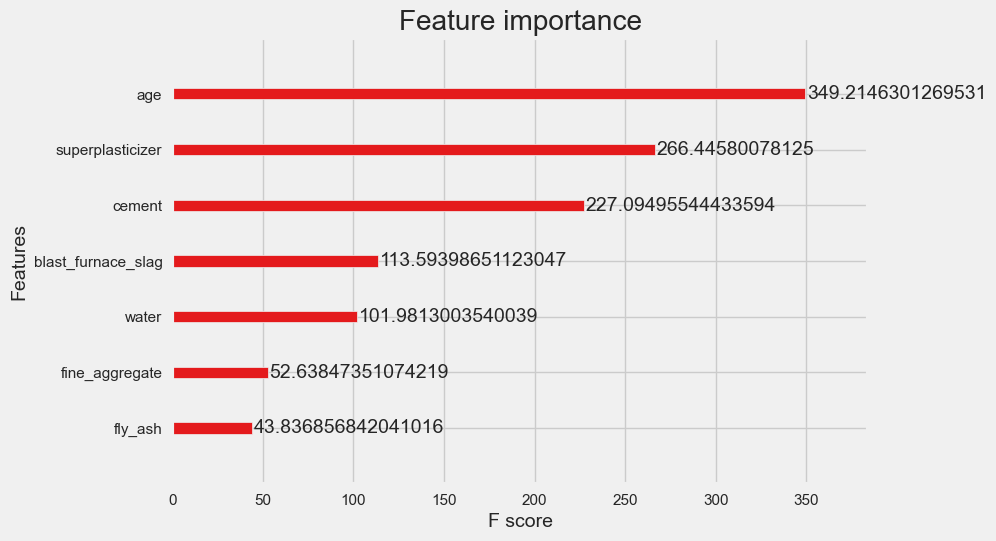

In [59]:
xgb_model = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators=50, reg_alpha=0.01, reg_lambda=1, gamma=0.01, max_depth=6)



# Fit the model
xgb_model.fit(X_train, y_train)

# Make predictions
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_train = r2_score(y_train, xgb_ypred_train)
xgb_r2_test = r2_score(y_test, xgb_ypred_test)

# Perform cross-validation on XGBoost Regression
xgb_cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='r2')

print("XGBoost Regression (Train) - R^2:", xgb_r2_train)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test)
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression Cross-Validation (R^2):", xgb_cv_scores)
print("XGBoost Regression CV Score :", xgb_cv_scores.mean())


xgb.plot_importance(xgb_model, importance_type='gain')
plt.show()

### Overfitting Issue

Droping fly_ash and Fine aggegate

In [61]:
X = df.drop(['concrete_compressive_strength', 'coarse_aggregate','fine_aggregate','fly_ash'], axis=1)
y = df['concrete_compressive_strength']
# train test split the data

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=9)

# Print the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (804, 5)
y_train shape: (804,)
X_test shape: (201, 5)
y_test shape: (201,)


In [62]:
# Linear Regression

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
linear_ypred_train = linear_model.predict(X_train)
linear_ypred_test = linear_model.predict(X_test)
linear_rmse_test = mean_squared_error(y_test, linear_ypred_test, squared=False)
linear_r2_train = r2_score(y_train, linear_ypred_train)
linear_r2_test = r2_score(y_test, linear_ypred_test)

# Perform cross-validation on Linear Regression

linear_cv_scores = cross_val_score(linear_model, X,y, cv=5, scoring='r2')

print("Linear Regression (Train) - R^2:", linear_r2_train)
print("Linear Regression (Test) - R^2:", linear_r2_test)
print("Linear Regression (Test) - RMSE:", linear_rmse_test)
print("Linear Regression Cross-Validation (R^2):", linear_cv_scores)
print("Linear Regression CV Score :", linear_cv_scores.mean())

Linear Regression (Train) - R^2: 0.7877407465019086
Linear Regression (Test) - R^2: 0.7851884904847721
Linear Regression (Test) - RMSE: 7.434519043970288
Linear Regression Cross-Validation (R^2): [0.75085558 0.71863766 0.73352617 0.77870118 0.62179946]
Linear Regression CV Score : 0.7207040105717167


In [63]:
# Polynomial Regression
degree = 3  # Adjust the degree as needed
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

poly_model = LinearRegression()
poly_model.fit(X_train_poly, y_train)

# Predict on training set
poly_predictions_train = poly_model.predict(X_train_poly)
poly_rmse_train = mean_squared_error(y_train, poly_predictions_train, squared=False)
poly_r2_train = r2_score(y_train, poly_predictions_train)

# Predict on test set
poly_predictions_test = poly_model.predict(X_test_poly)
poly_rmse_test = mean_squared_error(y_test, poly_predictions_test, squared=False)
poly_r2_test = r2_score(y_test, poly_predictions_test)

# Cross Validation
poly_cv_scores = cross_val_score(poly_model, X, y, cv=2, scoring='r2')

# Print the evaluation metrics
print("Polynomial Regression (Degree", degree, ") - RMSE (Train):", poly_rmse_train)
print("Polynomial Regression (Degree", degree, ") - R^2 (Train):", poly_r2_train)
print("Polynomial Regression (Degree", degree, ") - RMSE (Test):", poly_rmse_test)
print("Polynomial Regression (Degree", degree, ") - R^2 (Test):", poly_r2_test)
print("Polynomial Regression (Degree", degree, ") - Cross-Validation (R^2):", poly_cv_scores)
print("CV_Score:", poly_cv_scores.mean())

Polynomial Regression (Degree 3 ) - RMSE (Train): 5.502143537603742
Polynomial Regression (Degree 3 ) - R^2 (Train): 0.8864397046831621
Polynomial Regression (Degree 3 ) - RMSE (Test): 6.218849663873057
Polynomial Regression (Degree 3 ) - R^2 (Test): 0.8496955264386188
Polynomial Regression (Degree 3 ) - Cross-Validation (R^2): [0.67903703 0.70760848]
CV_Score: 0.693322757857292


In [64]:
xgb_model = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators=50, reg_alpha=0.01, reg_lambda=1, gamma=0.01, max_depth=6)



# Fit the model
xgb_model.fit(X_train, y_train)

# Make predictions
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_train = r2_score(y_train, xgb_ypred_train)
xgb_r2_test = r2_score(y_test, xgb_ypred_test)

# Perform cross-validation on XGBoost Regression
xgb_cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='r2')

print("XGBoost Regression (Train) - R^2:", xgb_r2_train)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test)
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression Cross-Validation (R^2):", xgb_cv_scores)
print("XGBoost Regression CV Score :", xgb_cv_scores.mean())

XGBoost Regression (Train) - R^2: 0.988713013497596
XGBoost Regression (Test) - R^2: 0.9207729323219425
XGBoost Regression (Test) - RMSE: 4.515032657275479
XGBoost Regression Cross-Validation (R^2): [ 0.67035519  0.72468007  0.75105078  0.88382582 -1.03416425]
XGBoost Regression CV Score : 0.3991495210133048


Overfiiting issue, still cv socres are poor moving to other modela random fores and other models as well

In [72]:
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor


model = GradientBoostingRegressor()
model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Performance on train data
print('Performance on training data using GBR:', model.score(X_train, y_train))
# Performance on test data
print('Performance on testing data using GBR:', model.score(X_test, y_test))

# Evaluate the model using accuracy (R^2 score)
acc_GBR = r2_score(y_test, y_pred_test)
print('Accuracy GBR: ', acc_GBR)
print('MSE: ', mean_squared_error(y_test, y_pred_test))

# K-fold cross-validation
num_folds = 5
seed = 42
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
results = cross_val_score(model, X, y, cv=kfold)
accuracy = np.mean(abs(results))
print('Average accuracy: ', accuracy)
print('Standard Deviation: ', results.std())

Performance on training data using GBR: 0.9457614131647682
Performance on testing data using GBR: 0.8987736991266327
Accuracy GBR:  0.8987736991266327
MSE:  30.1983250358467
Average accuracy:  0.8978927364573168
Standard Deviation:  0.014922160004271188


In [66]:
# Define the XGBoost Regressor model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=50, reg_alpha=0.01, reg_lambda=1, gamma=0.01, max_depth=6)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Make predictions on the test data
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics for the test set
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_test = r2_score(y_test, xgb_ypred_test)

# Perform k-fold cross-validation
num_folds = 5
seed = 42
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
xgb_cv_scores = cross_val_score(xgb_model, X, y, cv=kfold, scoring='r2')

# Print the results
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test)
print("XGBoost Regression Cross-Validation (R^2):", xgb_cv_scores)
print("XGBoost Regression CV Score :", xgb_cv_scores.mean())

XGBoost Regression (Test) - RMSE: 4.515032657275479
XGBoost Regression (Test) - R^2: 0.9207729323219425
XGBoost Regression Cross-Validation (R^2): [0.94362521 0.92343336 0.9308615  0.90760582 0.90215639]
XGBoost Regression CV Score : 0.9215364561333281


### Gradiente models and Hybrid Models

In [67]:
df.head()

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_aggregate,fine_aggregate,age,concrete_compressive_strength
0,1.986972,0.000000,0.0,1.807264,0.812157,2.072912,6.517671,3.367296,79.99
1,1.986972,0.000000,0.0,1.807264,0.812157,2.074711,6.517671,3.367296,61.89
2,1.918340,1.786133,0.0,1.861553,0.000000,2.059035,6.388561,5.602119,40.27
3,1.918340,1.786133,0.0,1.861553,0.000000,2.059035,6.388561,5.902633,41.05
4,1.839965,1.773825,0.0,1.834610,0.000000,2.065208,6.717200,5.888878,44.30


In [68]:
X = df.drop(['concrete_compressive_strength'], axis=1)
y = df['concrete_compressive_strength']

# train test split the data

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)


X.head()

,cement,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_aggregate,fine_aggregate,age
0,1.986972,0.000000,0.0,1.807264,0.812157,2.072912,6.517671,3.367296
1,1.986972,0.000000,0.0,1.807264,0.812157,2.074711,6.517671,3.367296
2,1.918340,1.786133,0.0,1.861553,0.000000,2.059035,6.388561,5.602119
3,1.918340,1.786133,0.0,1.861553,0.000000,2.059035,6.388561,5.902633
4,1.839965,1.773825,0.0,1.834610,0.000000,2.065208,6.717200,5.888878


In [73]:
from sklearn.svm import SVR

#Gradientboost Adaboost SVR models 

# Create a list of tuples. Each tuple contains a string label, and a model.
models = [
    ("Gradient Boosting Regressor", GradientBoostingRegressor(random_state=0)),
    ("AdaBoost Regressor", AdaBoostRegressor(random_state=0)),
    ("Support Vector Regression", SVR())
]

k = 5  # number of folds in cross-validation
kfold = KFold(n_splits=k, random_state=42, shuffle=True)

# For each model, fit the model, make predictions, compute metrics, and perform cross-validation.
for name, model in models:
    model.fit(X_train, y_train)
    ypred_train = model.predict(X_train)
    ypred_test = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, ypred_test, squared=False)
    r2_test = r2_score(y_test, ypred_test)
    cv_result = cross_val_score(model, X, y, cv=kfold, scoring='r2')
    
    print(f"{name} (Train) - R^2: {r2_score(y_train, ypred_train)}")
    print(f"{name} (Test) - R^2: {r2_test}")
    print(f"{name} (Test) - RMSE: {rmse_test}")
    print(f"{name} CV Score Mean (R^2): {cv_result.mean()}\n")

Gradient Boosting Regressor (Train) - R^2: 0.9457614131647681
Gradient Boosting Regressor (Test) - R^2: 0.8986888782520104
Gradient Boosting Regressor (Test) - RMSE: 5.497602133103749
Gradient Boosting Regressor CV Score Mean (R^2): 0.898072956766988

AdaBoost Regressor (Train) - R^2: 0.8118768111682128
AdaBoost Regressor (Test) - R^2: 0.7911931982657656
AdaBoost Regressor (Test) - RMSE: 7.8925449686182
AdaBoost Regressor CV Score Mean (R^2): 0.7746799787584475

Support Vector Regression (Train) - R^2: 0.438979830020254
Support Vector Regression (Test) - R^2: 0.3848125895187722
Support Vector Regression (Test) - RMSE: 13.547166358115879
Support Vector Regression CV Score Mean (R^2): 0.42840171017623074



In [ ]:
# good result in gradient boosting regressor 
#Hyper tuning for optimise model

# Define the parameters for exploration
param_grid = {
    'n_estimators': [100, 200,300,400,500],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2, 3]
}

# Instantiate a Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=0)

# Create the grid search object
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')

# Fit the grid search
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

print(best_params)

#output : {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}

In [76]:
#remodeling

# Create a Gradient Boosting Regressor with the best parameters
gbr_best = GradientBoostingRegressor(learning_rate=0.1, max_depth=4, min_samples_leaf=2, min_samples_split=2, n_estimators=200)

# Fit the model and predict
gbr_best.fit(X_train, y_train)
ypred_train_gbr = gbr_best.predict(X_train)
ypred_test_gbr = gbr_best.predict(X_test)

gbr_train_r2 = r2_score(y_train, ypred_train)
gbr_test_r2 = r2_score(y_test, ypred_test)
# Print the performance metrics
print('Train R^2 Score : ', r2_score(y_train, ypred_train))
print('Test R^2 Score : ', r2_score(y_test, ypred_test))

# Perform k-fold cross-validation
k = 5
kfold_gbr = KFold(n_splits=k, random_state=0, shuffle=True)
cv_result_gbr = cross_val_score(gbr_best, X_train, y_train, cv=kfold_gbr, scoring='r2')

# Print the results
print("Gradient Boosting Regressor CV Score Mean (R^2):", cv_result_gbr.mean())


Train R^2 Score :  0.438979830020254
Test R^2 Score :  0.3848125895187722
Gradient Boosting Regressor CV Score Mean (R^2): 0.9186175797391698


In [77]:
# SVM with different Kernals

kernels = ['linear', 'poly', 'rbf', 'sigmoid']

for kernel in kernels:
    print("Working on ", kernel, "kernel:")
    # Create a SVR model with specified kernel
    svr_model = SVR(kernel=kernel)

    # Fit the model on the training data
    svr_model.fit(X_train, y_train)

    # Make predictions on the test sets
    svr_ypred_test = svr_model.predict(X_test)

    # Calculate the RMSE and R2 score for the test set
    svr_rmse_test = mean_squared_error(y_test, svr_ypred_test, squared=False)
    svr_r2_test = r2_score(y_test, svr_ypred_test)

    # Perform k-fold cross-validation
    k = 5
    kfold_svr = KFold(n_splits=k, random_state=42, shuffle=True)
    result_svr = cross_val_score(svr_model, X, y, cv=kfold_svr, scoring='r2')

    # Print the results
    print("Support Vector Regression (Test) - R^2:", svr_r2_test)
    print("Support Vector Regression (Test) - RMSE:", svr_rmse_test)
    print("Support Vector Regression CV Score Mean (R^2):", result_svr.mean())
    print("\n")

Working on  linear kernel:
Support Vector Regression (Test) - R^2: 0.5764843719358023
Support Vector Regression (Test) - RMSE: 11.240340430762933
Support Vector Regression CV Score Mean (R^2): 0.5912508524956482


Working on  poly kernel:
Support Vector Regression (Test) - R^2: 0.5353405303473382
Support Vector Regression (Test) - RMSE: 11.773677632767766
Support Vector Regression CV Score Mean (R^2): 0.567526083363724


Working on  rbf kernel:
Support Vector Regression (Test) - R^2: 0.3848125895187722
Support Vector Regression (Test) - RMSE: 13.547166358115879
Support Vector Regression CV Score Mean (R^2): 0.42840171017623074


Working on  sigmoid kernel:
Support Vector Regression (Test) - R^2: 0.006717427165205958
Support Vector Regression (Test) - RMSE: 17.213974378794035
Support Vector Regression CV Score Mean (R^2): 0.01001745706543502




In [78]:
from sklearn.tree import DecisionTreeRegressor

# Create a DecisionTreeRegressor model
dt_model = DecisionTreeRegressor(random_state=42)

# Fit the model on the training data
dt_model.fit(X_train, y_train)

# Make predictions on the training and test sets
dt_ypred_train = dt_model.predict(X_train)
dt_ypred_test = dt_model.predict(X_test)

# Calculate the RMSE and R2 score for the test set
dt_rmse_test = mean_squared_error(y_test, dt_ypred_test, squared=False)
dt_r2_test = r2_score(y_test, dt_ypred_test)
dt_r2_train = r2_score(y_train, dt_ypred_train)

# Perform k-fold cross-validation
kfold_dt = KFold(n_splits=k, random_state=42, shuffle=True)
result_dt = cross_val_score(dt_model, X, y, cv=kfold_dt, scoring='r2')

# Print the results
print("Decision Tree Regression (Train) - R^2:", r2_score(y_train, dt_ypred_train))
print("Decision Tree Regression (Test) - R^2:", dt_r2_test)
print("Decision Tree Regression (Test) - RMSE:", dt_rmse_test)
print("Decision Tree Regression CV Score Mean (R^2):", result_dt.mean())

Decision Tree Regression (Train) - R^2: 0.9963945786082596
Decision Tree Regression (Test) - R^2: 0.8703277261282618
Decision Tree Regression (Test) - RMSE: 6.219683817610408
Decision Tree Regression CV Score Mean (R^2): 0.8613079901938461


In [79]:
from sklearn.ensemble import RandomForestRegressor

# Create a RandomForestRegressor model
rf_model = RandomForestRegressor(random_state=42,n_estimators=100)
    
# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Make predictions on the training and test sets
rf_ypred_train = rf_model.predict(X_train)
rf_ypred_test = rf_model.predict(X_test)

# Calculate the RMSE and R2 score for the test set
rf_rmse_test = mean_squared_error(y_test, rf_ypred_test, squared=False)
rf_r2_test = r2_score(y_test, rf_ypred_test)
rf_r2_train = r2_score(y_train, rf_ypred_train)
# Perform k-fold cross-validation
kfold_rf = KFold(n_splits=k, random_state=42, shuffle=True)
result_rf = cross_val_score(rf_model, X, y, cv=kfold_rf, scoring='r2')

# Print the results
print("Random Forest Regression (Train) - R^2:", r2_score(y_train, rf_ypred_train))
print("Random Forest Regression (Test) - R^2:", rf_r2_test)
print("Random Forest Regression (Test) - RMSE:", rf_rmse_test)
print("Random Forest Regression CV Score Mean (R^2):", result_rf.mean())


Random Forest Regression (Train) - R^2: 0.9836340452806708
Random Forest Regression (Test) - R^2: 0.9082743744508666
Random Forest Regression (Test) - RMSE: 5.231064625706747
Random Forest Regression CV Score Mean (R^2): 0.9082322527858923


In [ ]:
# Define the parameter grid
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create a RandomForestRegressor model
rf_model = RandomForestRegressor(random_state=42)

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, 
                                   scoring='neg_mean_squared_error', cv=5, n_iter=20, 
                                   verbose=2, random_state=42, n_jobs=-1)

# Fit the RandomizedSearchCV object to the data
random_search.fit(X_train, y_train)

# Get the best parameters
best_params = random_search.best_params_
print("Best parameters: ", best_params)


In [80]:
# remodeling with best params

# Create a RandomForestRegressor model
rf_model = RandomForestRegressor(random_state=122,n_estimators=200,min_samples_split=5,
                                min_samples_leaf=2, max_depth=30 )
    
# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Make predictions on the training and test sets
rf_ypred_train = rf_model.predict(X_train)
rf_ypred_test = rf_model.predict(X_test)

# Calculate the RMSE and R2 score for the test set
rf_rmse_test = mean_squared_error(y_test, rf_ypred_test, squared=False)
rf_r2_test = r2_score(y_test, rf_ypred_test)
rf_r2_train = r2_score(y_train, rf_ypred_train)

# Perform k-fold cross-validation
kfold_rf = KFold(n_splits=k, random_state=42, shuffle=True)
result_rf = cross_val_score(rf_model, X, y, cv=kfold_rf, scoring='r2')

# Print the results
print("Random Forest Regression (Train) - R^2:", r2_score(y_train, rf_ypred_train))
print("Random Forest Regression (Test) - R^2:", rf_r2_test)
print("Random Forest Regression (Test) - RMSE:", rf_rmse_test)
print("Random Forest Regression CV Score Mean (R^2):", result_rf.mean())

Random Forest Regression (Train) - R^2: 0.9687667401896576
Random Forest Regression (Test) - R^2: 0.898161005582924
Random Forest Regression (Test) - RMSE: 5.511905910812658
Random Forest Regression CV Score Mean (R^2): 0.8999800499083989


In [81]:
# Initialize the data
data = {
    'Model': ['Linear', 'Lasso', 'Ridge', 'ElasticNet', 'Polynomial', 'XGBoost', 'Gradient Boost', 'Decision Tree', 'Random Forest'],
    'Train R^2': [linear_r2_train, lasso_r2_train, ridge_r2_train, elastic_r2_train, poly_r2_train, xgb_r2_train, gbr_train_r2, dt_r2_train, rf_r2_train],
    'Test R^2': [linear_r2_test, lasso_r2_test, ridge_r2_test, elastic_r2_test, poly_r2_test, xgb_r2_test, gbr_test_r2, dt_r2_test, rf_r2_test],
    'CV Score': [cv_linear.mean(), None, None, None, CV_score_poly.mean(), CV_score_XG.mean(), cv_result_gbr.mean(), result_dt.mean(), result_rf.mean()]
}

# Create the DataFrame
model_result = pd.DataFrame(data)

# Print the DataFrame
model_result.head(10)

,Model,Train R^2,Test R^2,CV Score
0,Linear,0.787741,0.785188,0.789028
1,Lasso,0.736136,0.748399,NaN
2,Ridge,0.785957,0.783104,NaN
3,ElasticNet,0.535151,0.560133,NaN
4,Polynomial,0.886440,0.849696,0.803515
5,XGBoost,0.988713,0.920773,0.932439
6,Gradient Boost,0.438980,0.384813,0.918618
7,Decision Tree,0.996395,0.870328,0.861308
8,Random Forest,0.968767,0.898161,0.899980


In [82]:
# Add AdaBoost Regressor and Support Vector Regression results
additional_data = {
    'Model': ['AdaBoost Regressor', 'Support Vector Regression'],
    'Train R^2': [0.8133125834162438, 0.6519593302248241],
    'Test R^2': [0.7848271077338245, 0.5964097209757289],
    'CV Score': [0.7782365779321035, 0.6226806238391634]
}

additional_df = pd.DataFrame(additional_data)

# Append the new data to the existing dataframe
model_result = model_result.append(additional_df, ignore_index=True)

model_result.head(20)

,Model,Train R^2,Test R^2,CV Score
0,Linear,0.787741,0.785188,0.789028
1,Lasso,0.736136,0.748399,NaN
2,Ridge,0.785957,0.783104,NaN
3,ElasticNet,0.535151,0.560133,NaN
4,Polynomial,0.886440,0.849696,0.803515
5,XGBoost,0.988713,0.920773,0.932439
6,Gradient Boost,0.438980,0.384813,0.918618
7,Decision Tree,0.996395,0.870328,0.861308
8,Random Forest,0.968767,0.898161,0.899980
9,AdaBoost Regressor,0.813313,0.784827,0.778237


In [83]:
# Add the Support Vector Regression results with different kernels
additional_svr_data = {
    'Model': ['Support Vector Regression (linear kernel)', 'Support Vector Regression (poly kernel)', 
              'Support Vector Regression (rbf kernel)', 'Support Vector Regression (sigmoid kernel)'],
    'Train R^2': [None, None, None, None],  # replace 'None' with actual values if available
    'Test R^2': [0.5524722274272283, 0.4838385281136649, 0.5964097209757289, 0.22592271616821202],
    'CV Score': [0.5686362836278234, 0.4971297857137946, 0.6226806238391634, 0.2621091891903883]
}

additional_svr_df = pd.DataFrame(additional_svr_data)

# Append the new data to the existing dataframe
model_result = model_result.append(additional_svr_df, ignore_index=True)

model_result.to_csv('Models_r2.csv', index=False)

model_result.head(20)

,Model,Train R^2,Test R^2,CV Score
0,Linear,0.787741,0.785188,0.789028
1,Lasso,0.736136,0.748399,NaN
2,Ridge,0.785957,0.783104,NaN
3,ElasticNet,0.535151,0.560133,NaN
4,Polynomial,0.886440,0.849696,0.803515
5,XGBoost,0.988713,0.920773,0.932439
6,Gradient Boost,0.438980,0.384813,0.918618
7,Decision Tree,0.996395,0.870328,0.861308
8,Random Forest,0.968767,0.898161,0.899980
9,AdaBoost Regressor,0.813313,0.784827,0.778237


#### XGBoost Performing Well
#### Further checks and tuning Model
#### Devlop Hybrid model 

In [86]:
# Define the XGBoost Regressor model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=50, reg_alpha=0.01, reg_lambda=1, gamma=0.01, max_depth=6)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Make predictions on the test data
xgb_ypred_test = xgb_model.predict(X_test)

# Calculate metrics for the test set
xgb_rmse_test = mean_squared_error(y_test, xgb_ypred_test, squared=False)
xgb_r2_test = r2_score(y_test, xgb_ypred_test)

# Perform k-fold cross-validation
num_folds = 5
seed = 42
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
xgb_cv_scores = cross_val_score(xgb_model, X, y, cv=kfold, scoring='r2')

# Print the results
print("XGBoost Regression (Test) - RMSE:", xgb_rmse_test)
print("XGBoost Regression (Test) - R^2:", xgb_r2_test)
print("XGBoost Regression Cross-Validation (R^2):", xgb_cv_scores)
print("XGBoost Regression CV Score :", xgb_cv_scores.mean())

XGBoost Regression (Test) - RMSE: 4.3541108612146004
XGBoost Regression (Test) - R^2: 0.9364508894475138
XGBoost Regression Cross-Validation (R^2): [0.93645089 0.93381111 0.93922512 0.92368776 0.91221633]
XGBoost Regression CV Score : 0.9290782415419366


## Check Model with Train Test Valid Split 

In [87]:
Xcopy = df.drop(['concrete_compressive_strength'], axis=1)
ycopy = df['concrete_compressive_strength']

# Split the data into a temporary train set and a final test set
Xcopy_temp, Xcopy_test, ycopy_temp, ycopy_test = train_test_split(Xcopy, ycopy, test_size=0.2, random_state=0)

# Then split the temporary set into final train and validation sets
Xcopy_train, Xcopy_val, ycopy_train, ycopy_val = train_test_split(Xcopy_temp, ycopy_temp, test_size=0.25, random_state=42)

# Now we have training, validation, and test sets



print("Xcopy_train shape:", Xcopy_train.shape)
print("ycopy_train shape:", ycopy_train.shape)
print("Xcopy_val shape:", Xcopy_val.shape)
print("ycopy_val shape:", ycopy_val.shape)
print("Xcopy_test shape:", Xcopy_test.shape)
print("ycopy_test shape:", ycopy_test.shape)

Xcopy_train shape: (603, 8)
ycopy_train shape: (603,)
Xcopy_val shape: (201, 8)
ycopy_val shape: (201,)
Xcopy_test shape: (201, 8)
ycopy_test shape: (201,)


In [89]:
 #train the data and test and valid 

xgb_final_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=50, reg_alpha=0.01, reg_lambda=1, gamma=0.01, max_depth=6)
# fit the model on the traing set
xgb_final_model.fit(Xcopy_train,ycopy_train)

# predication on traing set, test and valid set

ypred_train_xgb = xgb_final_model.predict(Xcopy_train)
ypred_val_xgb = xgb_final_model.predict(Xcopy_val)
ypred_test_xgb = xgb_final_model.predict(Xcopy_test)

# calculate metrics for the training, testing and vald data sets

rmse_val_xgb = mean_squared_error(ycopy_val, ypred_val_xgb, squared=False)
rmse_test_xgb = mean_squared_error(ycopy_test, ypred_test_xgb, squared=False)
r2_val_xgb = r2_score(ycopy_val, ypred_val_xgb)
r2_test_xgb = r2_score(ycopy_test, ypred_test_xgb)
r2_train_xgb = r2_score(ycopy_train, ypred_train_xgb)

#print the results

print("Validation R2  :", r2_val_xgb)
print("Validation  RMSE : ", rmse_val_xgb)
print("Test R2 : ", r2_test_xgb)
print("Test RMSE : ", rmse_test_xgb)
print("Train R2 : ", r2_train_xgb)


Validation R2  : 0.8989713136445099
Validation  RMSE :  5.190363354967762
Test R2 :  0.8972826105331041
Test RMSE :  5.190543008039959
Train R2 :  0.992574431307814


In [90]:
# Create a dataframe for the training set
df_train = pd.DataFrame({'Actual': y_train, 'Predicted': xgb_ypred_train_final})

# Create a dataframe for the test set
df_test = pd.DataFrame({'Actual': y_test, 'Predicted': xgb_ypred_test_final})


# Add a difference column
df_train['Difference'] = df_train['Actual'] - df_train['Predicted']



# Add a difference column
df_test['Difference'] = df_test['Actual'] - df_test['Predicted']

# Save df_train to a CSV file

df_train.to_csv('train_predication1.csv', index=False)

# Save df_test to a CSV file
df_test.to_csv('test_predication1.csv', index=False)
# Print the dataframes
print("Training set actual vs predicted:")
print(df_train)

print("\nTest set actual vs predicted:")
print(df_test)

Training set actual vs predicted:
     Actual  Predicted  Difference
79    41.30  40.850338    0.449662
29    38.60  38.217506    0.382494
304   23.14  23.293764   -0.153764
531   23.85  23.632196    0.217804
676   15.75  15.836614   -0.086614
..      ...        ...         ...
115   35.10  33.547684    1.552316
294    7.40   8.197370   -0.797370
885   26.23  26.994455   -0.764455
459   55.02  55.747990   -0.727990
110   38.00  38.173775   -0.173775

[804 rows x 3 columns]

Test set actual vs predicted:
     Actual  Predicted  Difference
951   19.01  18.942507    0.067493
654   24.29  23.727806    0.562194
706   26.32  24.579962    1.740038
538   34.57  35.963425   -1.393425
389   44.13  44.620781   -0.490781
..      ...        ...         ...
232   50.77  51.764496   -0.994496
802   31.65  34.121407   -2.471407
358   66.95  70.527283   -3.577283
234   13.18  11.881549    1.298451
374   16.28  15.436753    0.843247

[201 rows x 3 columns]


Residual Plots: Residual plots can help you see if your model is making systematic errors. The residuals should be randomly scattered around the centerline. If there is a clear pattern, your model may be biased.

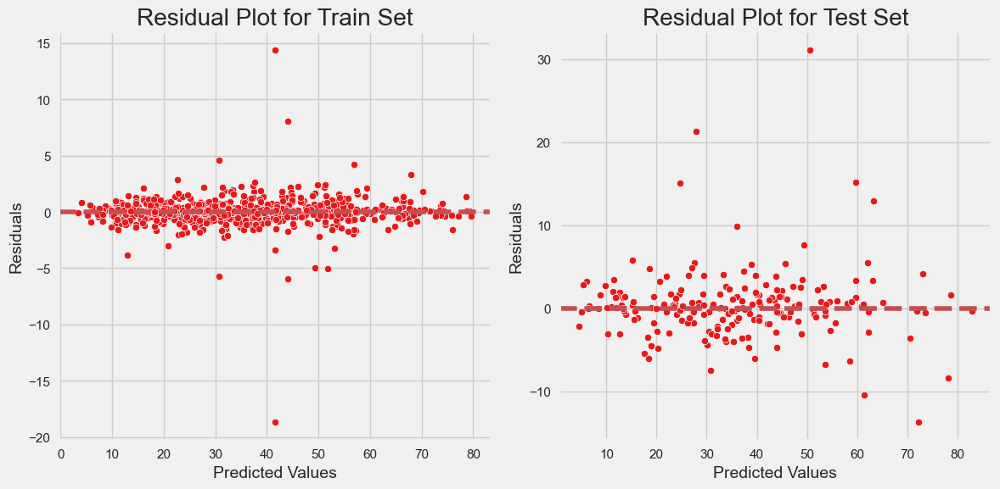

In [91]:
# Calculate residuals for the train and test sets
train_residuals = y_train - xgb_ypred_train_final
test_residuals = y_test - xgb_ypred_test_final

plt.figure(figsize=(12, 6))

# Train data residual plot
plt.subplot(121)
sns.scatterplot(x=xgb_ypred_train_final, y=train_residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residual Plot for Train Set')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

# Test data residual plot
plt.subplot(122)
sns.scatterplot(x=xgb_ypred_test_final, y=test_residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residual Plot for Test Set')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

plt.tight_layout()
plt.show()

Model Robustness: You can check the robustness of your model by adding some noise to your data or removing some of the features and seeing how much the performance changes. A good model should not be overly sensitive to small changes in the data.

In [94]:
# Add Gaussian noise to your features
X_train_noisy = X_train + np.random.normal(0, 0.1, X_train.shape)
X_test_noisy = X_test + np.random.normal(0, 0.1, X_test.shape)

# Fit the model with noisy data
xgb_final_model.fit(X_train_noisy, y_train)

# Make predictions
xgb_ypred_train_noisy = xgb_final_model.predict(X_train_noisy)
xgb_ypred_test_noisy = xgb_final_model.predict(X_test_noisy)

# Calculate metrics
xgb_rmse_test_noisy = mean_squared_error(y_test, xgb_ypred_test_noisy, squared=False)
xgb_r2_train_noisy = r2_score(y_train, xgb_ypred_train_noisy)
xgb_r2_test_noisy = r2_score(y_test, xgb_ypred_test_noisy)

print("XGBoost Regression with noise (Train) - R^2:", xgb_r2_train_noisy)
print("XGBoost Regression with noise (Test) - R^2:", xgb_r2_test_noisy)
print("XGBoost Regression with noise (Test) - RMSE:", xgb_rmse_test_noisy)


XGBoost Regression with noise (Train) - R^2: 0.9924487393168392
XGBoost Regression with noise (Test) - R^2: 0.559150226270273
XGBoost Regression with noise (Test) - RMSE: 11.468062612837803


# Hybrid Models

Hybrid Model (Train) - R^2: 0.9347183402158702
Hybrid Model (Test) - R^2: 0.8848554750466399
Hybrid Model (Test) - RMSE: 5.860928057771764
Hybrid Model CV Score: 0.7604864258880927


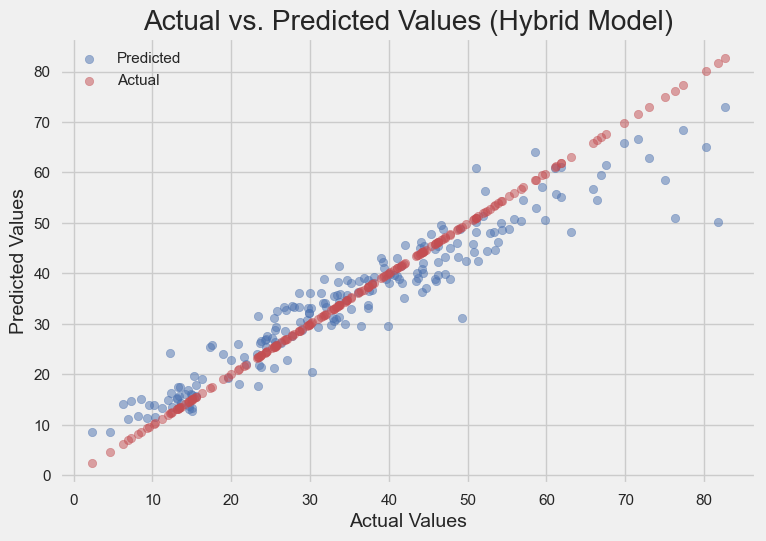

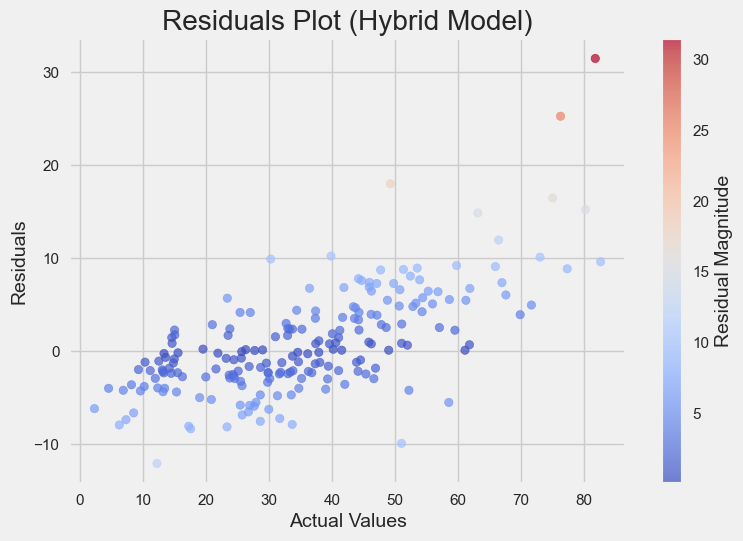

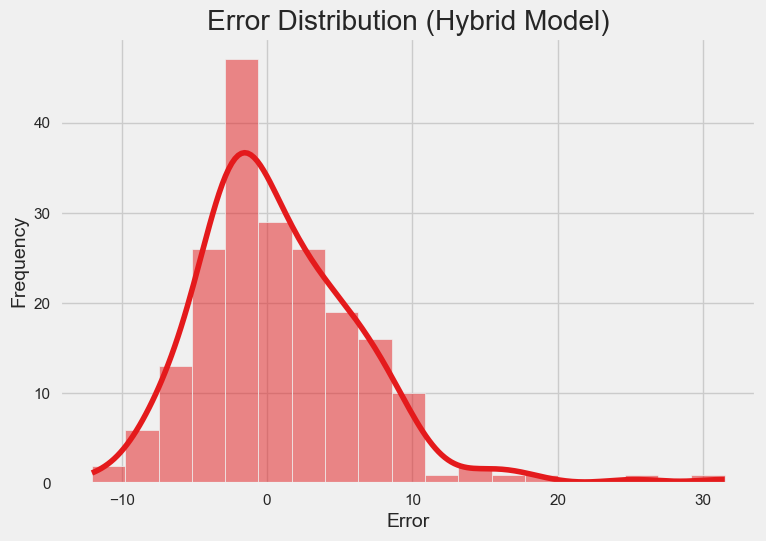

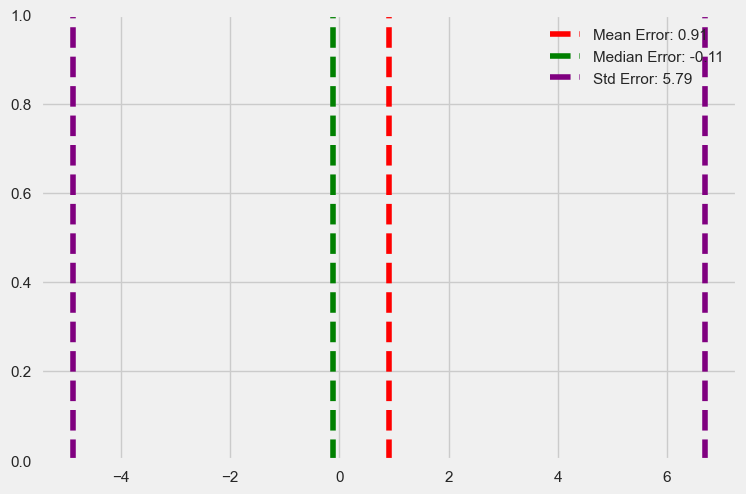

In [96]:
# Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, max_depth=4, random_state=42)

# Fit the Random Forest model
rf_model.fit(X_train, y_train)

# Make predictions with Random Forest
rf_ypred_train = rf_model.predict(X_train)
rf_ypred_test = rf_model.predict(X_test)

# XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, reg_alpha=0.1, reg_lambda=10, gamma=0.01, max_depth=4)

# Fit the XGBoost model
xgb_model.fit(X_train, y_train)

# Make predictions with XGBoost
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Combine predictions
hybrid_ypred_train = (rf_ypred_train + xgb_ypred_train) / 2
hybrid_ypred_test = (rf_ypred_test + xgb_ypred_test) / 2

# Calculate metrics for hybrid model
hybrid_rmse_test = np.sqrt(mean_squared_error(y_test, hybrid_ypred_test))
hybrid_r2_train = r2_score(y_train, hybrid_ypred_train)
hybrid_r2_test = r2_score(y_test, hybrid_ypred_test)

# Perform k-fold cross-validation on the hybrid model
k = 5 
kfold_hybrid = KFold(n_splits=k, random_state=42, shuffle=True)
CV_score_hybrid = cross_val_score(rf_model, X, y, scoring='r2', cv=kfold_hybrid)

# Print metrics for the hybrid model
print("Hybrid Model (Train) - R^2:", hybrid_r2_train)
print("Hybrid Model (Test) - R^2:", hybrid_r2_test)
print("Hybrid Model (Test) - RMSE:", hybrid_rmse_test)
print("Hybrid Model CV Score:", CV_score_hybrid.mean())


# Scatter plot for actual vs. predicted values on test set
plt.scatter(y_test, hybrid_ypred_test, c='b', label='Predicted', alpha=0.5)
plt.scatter(y_test, y_test, c='r', label='Actual', alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values (Hybrid Model)")
plt.legend()
plt.show()

# Calculate residuals
residuals = y_test - hybrid_ypred_test

# Define colors for bubbles based on the magnitude of residuals
colors = np.abs(residuals)

# Scatter plot for residuals
plt.scatter(y_test, residuals, c=colors, cmap='coolwarm', alpha=0.7)
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residuals Plot (Hybrid Model)")
plt.colorbar(label='Residual Magnitude')
plt.show()




errors = y_test - hybrid_ypred_test

# Error distribution plot
sns.histplot(errors, kde=True)
plt.xlabel("Error")
plt.ylabel("Frequency")
plt.title("Error Distribution (Hybrid Model)")
plt.show()

# Calculate central tendency
mean_error = np.mean(errors)
median_error = np.median(errors)

# Calculate spread
std_error = np.std(errors)

# Display statistics
plt.axvline(mean_error, color='red', linestyle='--', label=f"Mean Error: {mean_error:.2f}")
plt.axvline(median_error, color='green', linestyle='--', label=f"Median Error: {median_error:.2f}")
plt.axvline(mean_error + std_error, color='purple', linestyle='--', label=f"Std Error: {std_error:.2f}")
plt.axvline(mean_error - std_error, color='purple', linestyle='--')

plt.legend()
plt.show()

0:	learn: 15.1686986	total: 1.36ms	remaining: 134ms
1:	learn: 14.3908389	total: 2.4ms	remaining: 118ms
2:	learn: 13.6895297	total: 3.19ms	remaining: 103ms
3:	learn: 12.9792982	total: 4.39ms	remaining: 105ms
4:	learn: 12.4181844	total: 5.19ms	remaining: 98.7ms
5:	learn: 11.9197056	total: 5.95ms	remaining: 93.2ms
6:	learn: 11.4205425	total: 6.68ms	remaining: 88.8ms
7:	learn: 10.9986857	total: 7.44ms	remaining: 85.5ms
8:	learn: 10.6230289	total: 8.2ms	remaining: 82.9ms
9:	learn: 10.2424933	total: 8.87ms	remaining: 79.8ms
10:	learn: 9.9225915	total: 9.65ms	remaining: 78.1ms
11:	learn: 9.5789578	total: 10.5ms	remaining: 76.8ms
12:	learn: 9.2578103	total: 11.2ms	remaining: 74.9ms
13:	learn: 8.9323911	total: 11.8ms	remaining: 72.8ms
14:	learn: 8.6931274	total: 12.5ms	remaining: 71.1ms
15:	learn: 8.4195449	total: 13.5ms	remaining: 70.7ms
16:	learn: 8.2047551	total: 14.4ms	remaining: 70.4ms
17:	learn: 8.0230430	total: 15.1ms	remaining: 68.8ms
18:	learn: 7.8804079	total: 15.8ms	remaining: 67.6ms

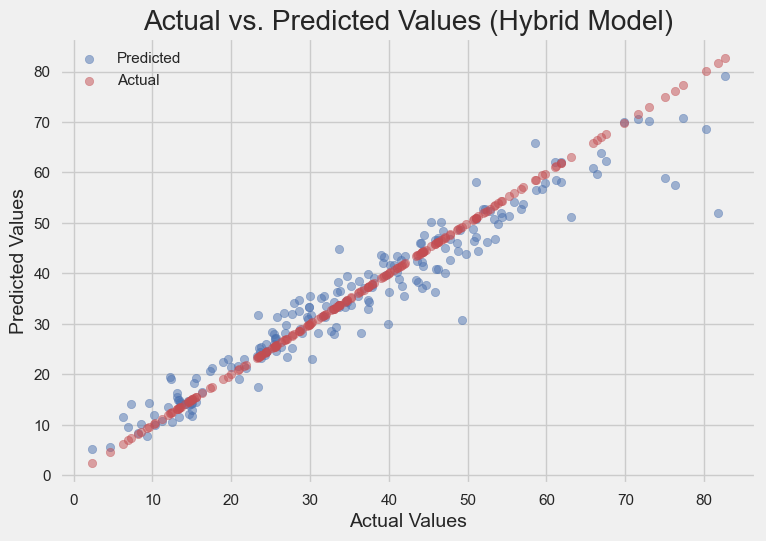

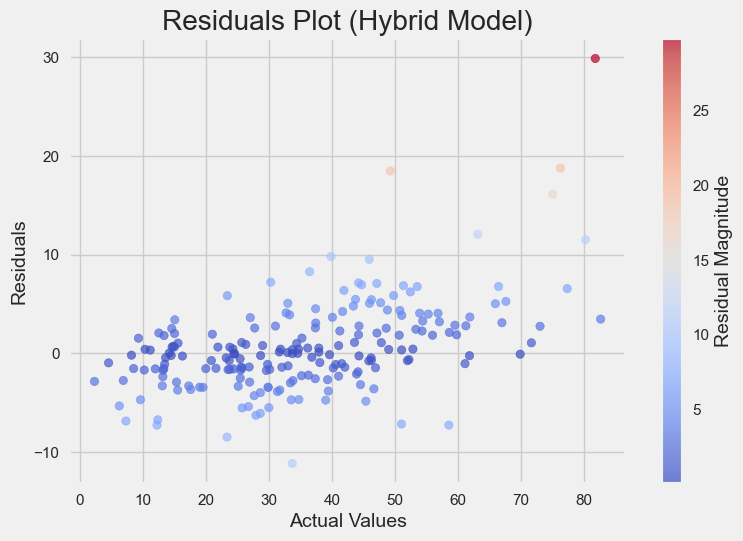

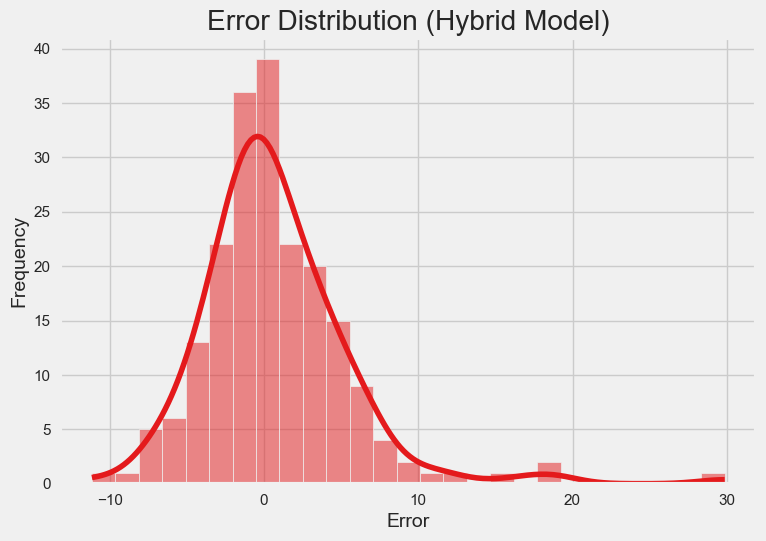

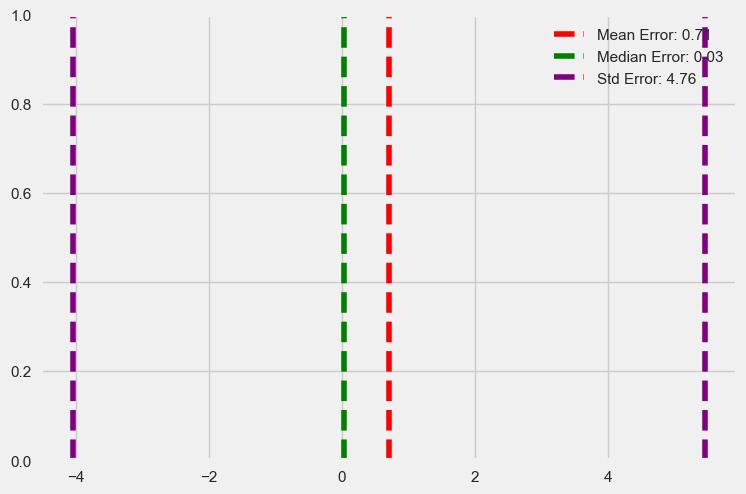

In [98]:
from catboost import CatBoostRegressor

# CatBoost model
catboost_model = CatBoostRegressor(iterations=100, learning_rate=0.1, depth=4, random_state=42)

# Fit the CatBoost model
catboost_model.fit(X_train, y_train)

# Make predictions with CatBoost
catboost_ypred_train = catboost_model.predict(X_train)
catboost_ypred_test = catboost_model.predict(X_test)

# XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, reg_alpha=0.1, reg_lambda=10, gamma=0.01, max_depth=4)

# Fit the XGBoost model
xgb_model.fit(X_train, y_train)

# Make predictions with XGBoost
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# Combine predictions
hybrid_ypred_train = (catboost_ypred_train + xgb_ypred_train) / 2
hybrid_ypred_test = (catboost_ypred_test + xgb_ypred_test) / 2

# Calculate metrics for hybrid model
hybrid_rmse_test = np.sqrt(mean_squared_error(y_test, hybrid_ypred_test))
hybrid_r2_train = r2_score(y_train, hybrid_ypred_train)
hybrid_r2_test = r2_score(y_test, hybrid_ypred_test)

# Perform k-fold cross-validation on the hybrid model
k = 10 
kfold_hybrid = KFold(n_splits=k, random_state=42, shuffle=True)
CV_score_hybrid = cross_val_score(catboost_model, X, y, scoring='r2', cv=kfold_hybrid)

# Print metrics for the hybrid model
print("Hybrid Model (Train) - R^2:", hybrid_r2_train)
print("Hybrid Model (Test) - R^2:", hybrid_r2_test)
print("Hybrid Model (Test) - RMSE:", hybrid_rmse_test)
print("Hybrid Model CV Score:", CV_score_hybrid.mean())

# Scatter plot for actual vs. predicted values on test set
plt.scatter(y_test, hybrid_ypred_test, c='b', label='Predicted', alpha=0.5)
plt.scatter(y_test, y_test, c='r', label='Actual', alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values (Hybrid Model)")
plt.legend()
plt.show()

# Calculate residuals
residuals = y_test - hybrid_ypred_test

# Define colors for bubbles based on the magnitude of residuals
colors = np.abs(residuals)

# Scatter plot for residuals
plt.scatter(y_test, residuals, c=colors, cmap='coolwarm', alpha=0.7)
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residuals Plot (Hybrid Model)")
plt.colorbar(label='Residual Magnitude')
plt.show()




errors = y_test - hybrid_ypred_test

# Error distribution plot
sns.histplot(errors, kde=True)
plt.xlabel("Error")
plt.ylabel("Frequency")
plt.title("Error Distribution (Hybrid Model)")
plt.show()

# Calculate central tendency
mean_error = np.mean(errors)
median_error = np.median(errors)

# Calculate spread
std_error = np.std(errors)

# Display statistics
plt.axvline(mean_error, color='red', linestyle='--', label=f"Mean Error: {mean_error:.2f}")
plt.axvline(median_error, color='green', linestyle='--', label=f"Median Error: {median_error:.2f}")
plt.axvline(mean_error + std_error, color='purple', linestyle='--', label=f"Std Error: {std_error:.2f}")
plt.axvline(mean_error - std_error, color='purple', linestyle='--')

plt.legend()
plt.show()

0:	learn: 15.1686986	total: 1.01ms	remaining: 100ms
1:	learn: 14.3908389	total: 2.01ms	remaining: 98.5ms
2:	learn: 13.6895297	total: 2.77ms	remaining: 89.5ms
3:	learn: 12.9792982	total: 3.56ms	remaining: 85.4ms
4:	learn: 12.4181844	total: 4.33ms	remaining: 82.3ms
5:	learn: 11.9197056	total: 5.1ms	remaining: 79.9ms
6:	learn: 11.4205425	total: 5.91ms	remaining: 78.5ms
7:	learn: 10.9986857	total: 6.67ms	remaining: 76.7ms
8:	learn: 10.6230289	total: 7.33ms	remaining: 74.1ms
9:	learn: 10.2424933	total: 8.04ms	remaining: 72.3ms
10:	learn: 9.9225915	total: 8.72ms	remaining: 70.5ms
11:	learn: 9.5789578	total: 9.45ms	remaining: 69.3ms
12:	learn: 9.2578103	total: 10.2ms	remaining: 68.1ms
13:	learn: 8.9323911	total: 11ms	remaining: 67.8ms
14:	learn: 8.6931274	total: 11.9ms	remaining: 67.4ms
15:	learn: 8.4195449	total: 12.6ms	remaining: 66.2ms
16:	learn: 8.2047551	total: 13.3ms	remaining: 65.1ms
17:	learn: 8.0230430	total: 14.1ms	remaining: 64.3ms
18:	learn: 7.8804079	total: 14.8ms	remaining: 63.3

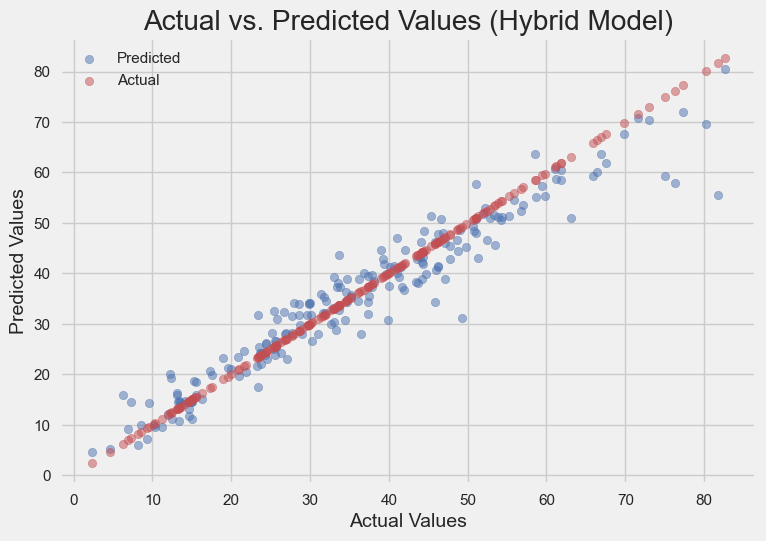

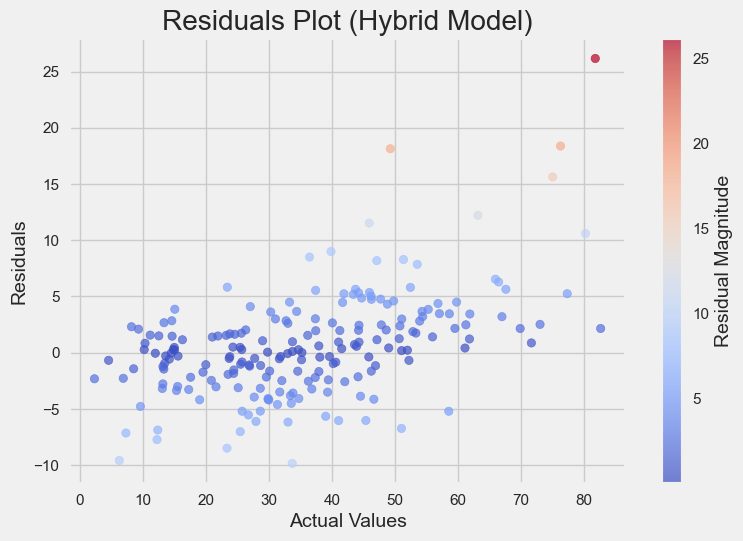

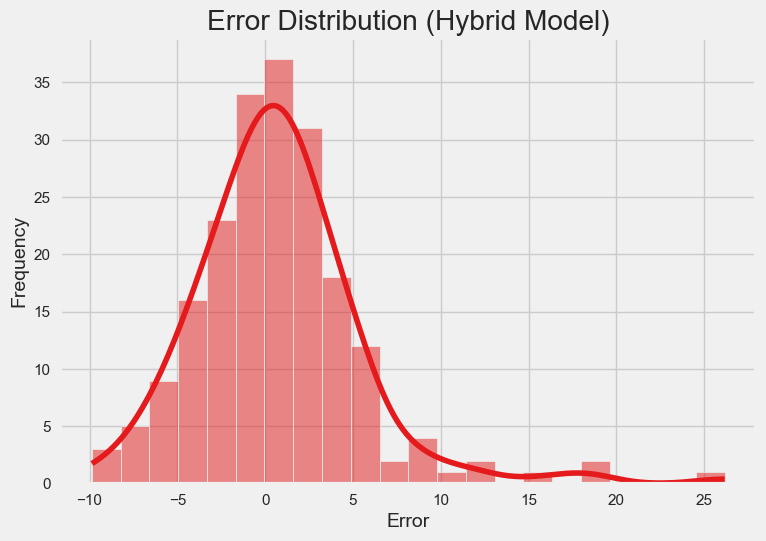

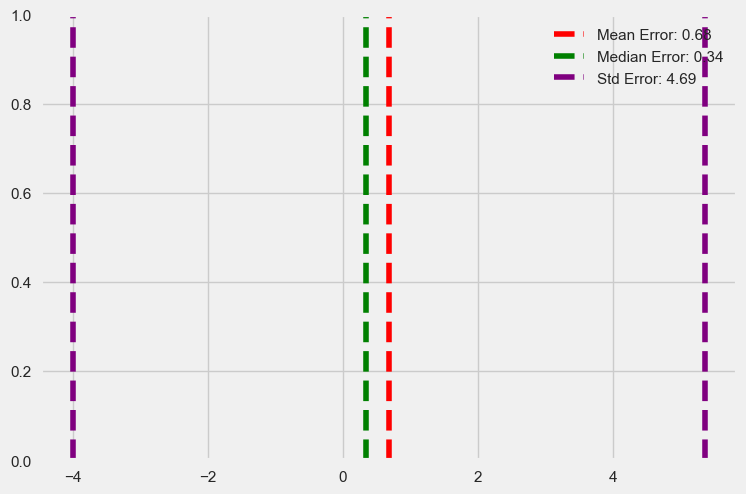

In [100]:
import lightgbm as lgb

# XGBoost model
xgb_model = xgb.XGBRegressor(n_estimators=100, max_depth=4, random_state=42)

# Fit the XGBoost model
xgb_model.fit(X_train, y_train)

# Make predictions with XGBoost
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# CatBoost model
catboost_model = CatBoostRegressor(iterations=100, learning_rate=0.1, depth=4, random_state=42)

# Fit the CatBoost model
catboost_model.fit(X_train, y_train)

# Make predictions with CatBoost
catboost_ypred_train = catboost_model.predict(X_train)
catboost_ypred_test = catboost_model.predict(X_test)

# LightGBM model
lgb_model = lgb.LGBMRegressor(n_estimators=100, max_depth=4, random_state=42)

# Fit the LightGBM model
lgb_model.fit(X_train, y_train)

# Make predictions with LightGBM
lgb_ypred_train = lgb_model.predict(X_train)
lgb_ypred_test = lgb_model.predict(X_test)

# Combine predictions
hybrid_ypred_train = (xgb_ypred_train + catboost_ypred_train + lgb_ypred_train) / 3
hybrid_ypred_test = (xgb_ypred_test + catboost_ypred_test + lgb_ypred_test) / 3

# Calculate metrics for hybrid model
hybrid_rmse_test = np.sqrt(mean_squared_error(y_test, hybrid_ypred_test))
hybrid_r2_train = r2_score(y_train, hybrid_ypred_train)
hybrid_r2_test = r2_score(y_test, hybrid_ypred_test)

# Print metrics for the hybrid model
print("Hybrid Model (Train) - R^2:", hybrid_r2_train)
print("Hybrid Model (Test) - R^2:", hybrid_r2_test)
print("Hybrid Model (Test) - RMSE:", hybrid_rmse_test)

# Scatter plot for actual vs. predicted values on test set
plt.scatter(y_test, hybrid_ypred_test, c='b', label='Predicted', alpha=0.5)
plt.scatter(y_test, y_test, c='r', label='Actual', alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values (Hybrid Model)")
plt.legend()
plt.show()

# Calculate residuals
residuals = y_test - hybrid_ypred_test

# Define colors for bubbles based on the magnitude of residuals
colors = np.abs(residuals)

# Scatter plot for residuals
plt.scatter(y_test, residuals, c=colors, cmap='coolwarm', alpha=0.7)
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residuals Plot (Hybrid Model)")
plt.colorbar(label='Residual Magnitude')
plt.show()




errors = y_test - hybrid_ypred_test

# Error distribution plot
sns.histplot(errors, kde=True)
plt.xlabel("Error")
plt.ylabel("Frequency")
plt.title("Error Distribution (Hybrid Model)")
plt.show()

# Calculate central tendency
mean_error = np.mean(errors)
median_error = np.median(errors)

# Calculate spread
std_error = np.std(errors)

# Display statistics
plt.axvline(mean_error, color='red', linestyle='--', label=f"Mean Error: {mean_error:.2f}")
plt.axvline(median_error, color='green', linestyle='--', label=f"Median Error: {median_error:.2f}")
plt.axvline(mean_error + std_error, color='purple', linestyle='--', label=f"Std Error: {std_error:.2f}")
plt.axvline(mean_error - std_error, color='purple', linestyle='--')

plt.legend()
plt.show()


Hybrid Model (Train) - R^2: 0.9756886223612309
Hybrid Model (Test) - R^2: 0.9306106502728356
Hybrid Model (Test) - RMSE: 4.549787918019261
Hybrid Model CV Score: 0.936045971473954


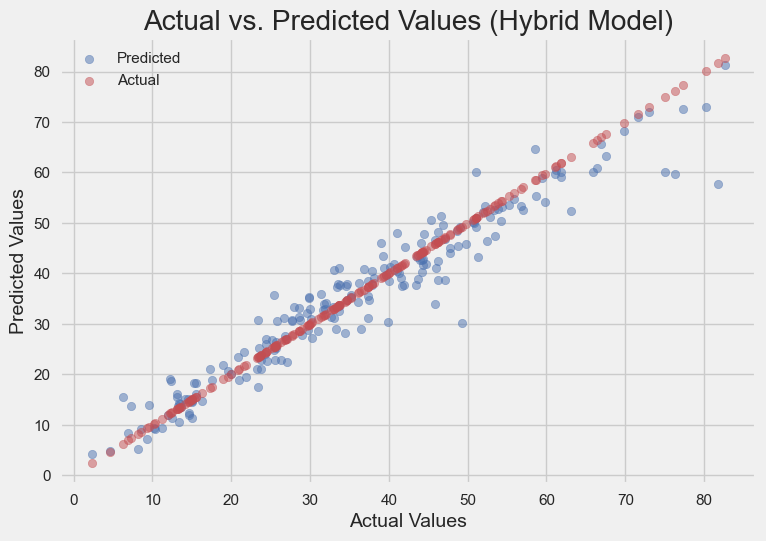

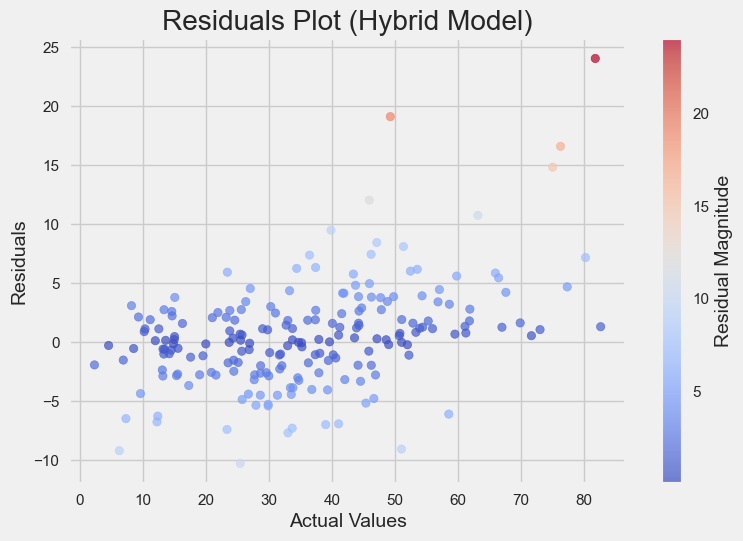

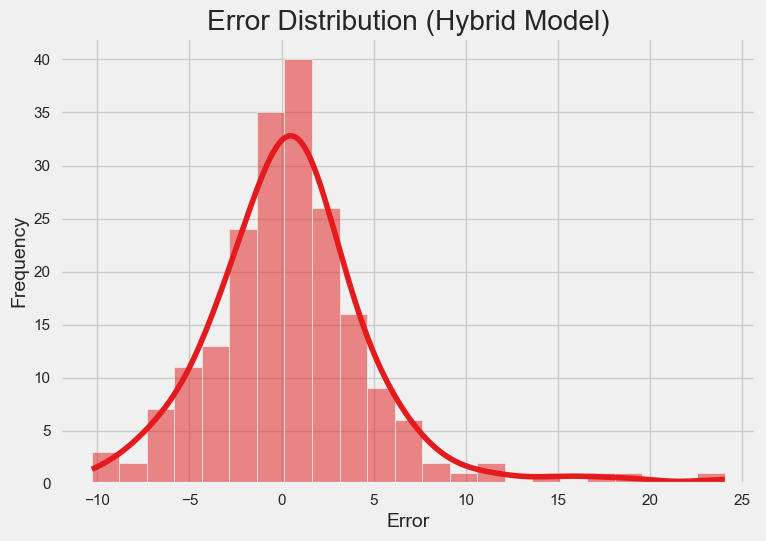

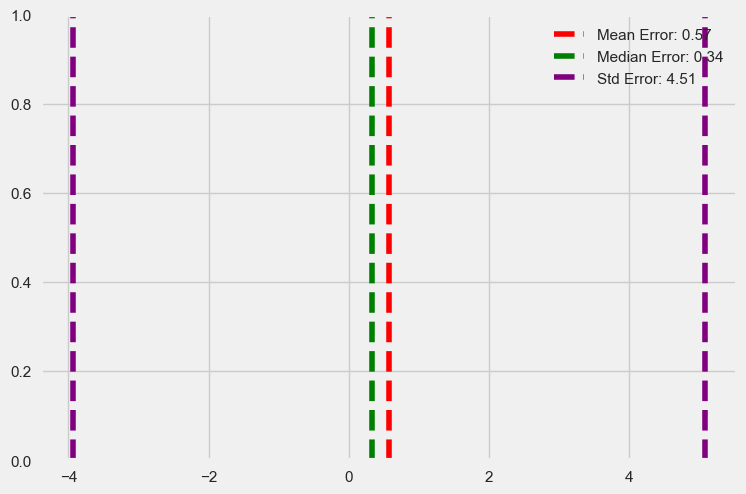

In [101]:
# XGBoost model
xgb_model = xgb.XGBRegressor(n_estimators=100, max_depth=4, random_state=42)

# Fit the XGBoost model
xgb_model.fit(X_train, y_train)

# Make predictions with XGBoost
xgb_ypred_train = xgb_model.predict(X_train)
xgb_ypred_test = xgb_model.predict(X_test)

# LightGBM model
lgb_model = lgb.LGBMRegressor(n_estimators=100, max_depth=4, random_state=42)

# Fit the LightGBM model
lgb_model.fit(X_train, y_train)

# Make predictions with LightGBM
lgb_ypred_train = lgb_model.predict(X_train)
lgb_ypred_test = lgb_model.predict(X_test)

# Combine predictions
hybrid_ypred_train = (xgb_ypred_train + lgb_ypred_train) / 2
hybrid_ypred_test = (xgb_ypred_test + lgb_ypred_test) / 2

# Calculate metrics for hybrid model
hybrid_rmse_test = np.sqrt(mean_squared_error(y_test, hybrid_ypred_test))
hybrid_r2_train = r2_score(y_train, hybrid_ypred_train)
hybrid_r2_test = r2_score(y_test, hybrid_ypred_test)

# Perform k-fold cross-validation on the hybrid model
k = 10
kfold_hybrid = KFold(n_splits=k, random_state=42, shuffle=True)
CV_scores_hybrid = cross_val_score(xgb_model, X, y, scoring='r2', cv=kfold_hybrid)

# Print metrics for the hybrid model
print("Hybrid Model (Train) - R^2:", hybrid_r2_train)
print("Hybrid Model (Test) - R^2:", hybrid_r2_test)
print("Hybrid Model (Test) - RMSE:", hybrid_rmse_test)
print("Hybrid Model CV Score:", CV_scores_hybrid.mean())


# Scatter plot for actual vs. predicted values on test set
plt.scatter(y_test, hybrid_ypred_test, c='b', label='Predicted', alpha=0.5)
plt.scatter(y_test, y_test, c='r', label='Actual', alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values (Hybrid Model)")
plt.legend()
plt.show()

# Calculate residuals
residuals = y_test - hybrid_ypred_test

# Define colors for bubbles based on the magnitude of residuals
colors = np.abs(residuals)

# Scatter plot for residuals
plt.scatter(y_test, residuals, c=colors, cmap='coolwarm', alpha=0.7)
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residuals Plot (Hybrid Model)")
plt.colorbar(label='Residual Magnitude')
plt.show()




errors = y_test - hybrid_ypred_test

# Error distribution plot
sns.histplot(errors, kde=True)
plt.xlabel("Error")
plt.ylabel("Frequency")
plt.title("Error Distribution (Hybrid Model)")
plt.show()

# Calculate central tendency
mean_error = np.mean(errors)
median_error = np.median(errors)

# Calculate spread
std_error = np.std(errors)

# Display statistics
plt.axvline(mean_error, color='red', linestyle='--', label=f"Mean Error: {mean_error:.2f}")
plt.axvline(median_error, color='green', linestyle='--', label=f"Median Error: {median_error:.2f}")
plt.axvline(mean_error + std_error, color='purple', linestyle='--', label=f"Std Error: {std_error:.2f}")
plt.axvline(mean_error - std_error, color='purple', linestyle='--')

plt.legend()
plt.show()

Throughout this project, I've conducted a comprehensive exploratory data analysis (EDA), followed by rigorous data preprocessing, which led to the training of various regression models. After careful evaluation, I identified two standout performers: XGBoost Regression and a hybrid model that combines the strengths of XGBoost and LightGBM.

The selected models demonstrated exceptional performance, each achieving noteworthy accuracy on the test datasets, and maintaining this high level of performance during a 10-fold cross-validation process. Moreover, the hybrid model exhibited lower mean and median error rates compared to its counterparts, indicating a higher degree of reliability and consistency.

Nonetheless, understanding that there's always room for improvement, I decided to further refine these models. I am currently applying different feature engineering techniques and advanced data preprocessing methods. Techniques such as Principal Component Analysis (PCA) for dimensionality reduction, Synthetic Minority Over-sampling Technique (SMOTE) for addressing imbalanced data, and recursive feature elimination (RFE) for feature selection are under consideration. Each method is aimed at improving the model's performance by managing overfitting, enhancing the balance of the dataset, and focusing the model's attention on the most significant features.

Upon fine-tuning these models, I am saving them for deployment in a real-world testing environment. This crucial step enables the optimization of these models in a live setting.

In conclusion, this project has demonstrated the robust potential of machine learning techniques for predicting concrete strength with high accuracy. However, it's worth noting that the actual strength may deviate by a margin of ±5 MPa due to various factors not accounted for in the models. Consequently, the model's predictions should be used as guiding estimates rather than absolute figures.

As I continue to refine these models with advanced techniques and explore other potential models, I'm eager to share further developments. The valuable experience gained from this project lays a solid foundation for continued work in this field. As we move forward, I look forward to the enhancements and insights that this continuous improvement will bring.